In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt

plt.style.use('seaborn-whitegrid')

mypath = '/Users/ensemble/Documents/Module_Principles_of_Data_Science/ProjectData/'


def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    filename = mypath + fig_id + "." + fig_extension
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(filename, format=fig_extension, dpi=resolution)


In [2]:
from six.moves import urllib

# Load footfall data - simple: one nicely structured CSV file


print("Loading footfall data....")
mainurl = 'https://data.yorkopendata.org/dataset/6449d8f5-76e7-4aff-bfb1-46d46542a56c/resource/a6e02f91-28ed-4c1d-bf39-67b876f6454c/download/'
filename = 'yorkcity_footfalldaily.csv'
### un-comment line below to load from Website directly ### 
#urllib.request.urlretrieve(mainurl + filename, mypath  + filename)
footfalldata =  pd.read_csv(mypath + 'yorkcity_footfalldaily.csv', parse_dates=[0], dayfirst=True)
footfalldata['Date'] = pd.to_datetime(footfalldata['Date'])
footfalldata = footfalldata.sort_values(by='Date')
print("-->footfall data loaded")


# Load nndr data - simple as well : one nicely structured CSV file
#import chardet # find the encoding
#with open(mypath + 'nndr.csv', 'rb') as f:
#    result = chardet.detect(f.readline()) 
#print(result) 
# possible encodings: 'ascii' 'latin1' 'utf-16' 'iso-8859-1' 'cp1252'
print("Loading NNDR data....")
mainurl = 'https://data.yorkopendata.org/dataset/33e9d8e9-14e5-4f5b-9382-12d76ae05afa/resource/4a349a29-a3da-4530-ab52-6ab941b40137/download/'
filename = 'nndr.csv'
### un-comment line below to load from Website directly ### 
#urllib.request.urlretrieve(mainurl + filename, mypath  + filename)
nndrdata =  pd.read_csv(mypath + 'nndr.csv', encoding = 'latin1', parse_dates=[0], dayfirst=True)   # for some reason the encoding was not standard utf8
print("-->NNDR data loaded")

# Load weather data - more complicated: one text file per month that need to be separately downloaded 
# and aggregated into one dataframe
mainurl = 'https://weather.elec.york.ac.uk/data/vaisala/archives/'
units = ['dd_mm_yy', 'C', 'C', 'C' , 'MPH', 'MPH', 'Deg', 'hPa', 'hPa', 'mm', '%', '%' , 'C', 'H:M:S', 'H:M:S'] 
# just taking note of the units displayed in each text file

def load_weather_data(start, end):   # one generic funtion to load the data between 2 datess  - date as 'mmyy'
    df = pd.DataFrame()
    print("Loading weather data....")
    header = ['Date', 'Temp_Ave','Temp_Min', 'Temp_Max', 'Wind_Ave', 'Wind_Max', 'Dir', 'Press_Min', 'Press_Max', 'Rain', 'Hum_Min', 'Hum_Max', 'Wind_Chill', 'Rain_Dur', 'Hail_Dur']      
    for y in list(range(int(start[-2:]),1 + int(end[-2:]))):
        for m in ['01','02','03','04','05','06','07','08','09','10','11','12']:
            if ((int(m) < int(start[:2])) & (y == int(start[-2:])))  | ((int(m) > int(end[:2])) & (y == int(end[-2:]))):
                txtname = m + str(y) + '.txt' #do nothing
            else:
                txtname = m + str(y) + '.txt'
                try:
                    ### un-comment line below to load from Website directly ### 
                    #urllib.request.urlretrieve(mainurl + txtname, mypath  + txtname)
                    df  = df.append(pd.read_csv(mypath + txtname, names = header, skiprows=3, delim_whitespace=True))
                except:
                     print(txtname, ' not found!')    
    df.Date = pd.to_datetime(df.Date, format='%d_%m_%y', dayfirst=True)  
    print("-->weather data loaded")
    return(df)
  
weatherdata = load_weather_data('0110', '0817')


# York City daily footfall in 5 locations available from https://data.gov.uk/dataset/footfall - also available hourly
# Published by City of York Council.   Licensed under  [Open Government Licence] Open Government Licence.
# https://data.gov.uk/dataset/footfall-cameras-location 

# Footfall is estimated from the feed from cameras located at various locations around the city centre 
# monitoring numbers of people walking past.  
# 
# We want to analyse this data, correlate it with other data (weather, seasonality, and possibly commercial venues occupancy rates) 
# to see if we can model it with some precision it
# A similar pr0ject has been conducted by M. Asher (Leeds Institute for Data Analytics), S. Brereton (Leeds City Council), and N. Malleson (Centre for Spatial Analysis and Policy at the School of Geography, University of Leeds.)
# http://lida.leeds.ac.uk/news/project-update-predictive-data-analytics-for-urban-footfall/

# The previous research looked at aggregate footfall data from Leeds city center,  added weather data and a holiday calendar
# One of the takeaway of the study was to emphasize the key proeminent explanatory variables: weather (temperature, rainfall) and day of the week.

# In this study, we want to look at a different dataset (York City centre footfall data) and we want to see how accurately
# we can model footfall for an individual street, not a group of streets in a similar location.
# The challenges here are numerous: (1) data will be sparser as we are restraining ourselves to a subset of the data,
# (2) data will be noisier, as the data collection procedure (cctv video feed) can suffer from site-specific issues:
# equipement malfuncion, change in operational conditions) etc...
# (3) we might require additional features to correlate and compensate for with the existing dataset
# and (4) we might have to use complex models which we are not familiar with (such as a Hidden Markov model or auto-regressive models)

# Despite those challenges, we believe that the issue is worth investigating for the following reasons:
# (1) footfall estimation is important for high street operators relying on passing trade (retail, restauration). 
# An accurate forecasting tool would be invaluable for store marketing and promotions, staff shift pattern management and potential revenue benchmarking
# (2) footfall dynamics for a given street should have an intrinsic structure as it is expected to be very corelated to
# long lasting geographical structures (number of shops, presence of major transport links, local population density)
# (3) there should be a fair amount of auto-correlation in the time series data as some of the previously identified drivers 
# are of a cyclical nature themselves


#http://www.localdatacompany.com provide precise footfall data and analysis, no prediction



Loading footfall data....
-->footfall data loaded
Loading NNDR data....
-->NNDR data loaded
Loading weather data....
-->weather data loaded


In [3]:
footfalldata.head()

,Date,SiteName,LocationName,LocationGroup,WeekDay,BRCYear,BRCQuarter,BRCMonth,BRCWeek,InCount,OutCount,TotalCount,BusinessInCount,BusinessOutCount,BusinessTotalCount,FactoredInCount,FactoredOutCount,FactoredTotalCount
10,2009-03-30,York,Coney Street,NaN,Monday,2009,NaN,March,13,26756.0,NaN,26756.0,NaN,NaN,NaN,NaN,NaN,NaN
11,2009-03-30,York,Parliament Street at M&S,NaN,Monday,2009,NaN,March,13,17112.0,NaN,17112.0,NaN,NaN,NaN,NaN,NaN,NaN
12,2009-03-31,York,Coney Street,NaN,Tuesday,2009,NaN,March,13,27857.0,NaN,27857.0,NaN,NaN,NaN,NaN,NaN,NaN
13,2009-03-31,York,Parliament Street at M&S,NaN,Tuesday,2009,NaN,March,13,19867.0,NaN,19867.0,NaN,NaN,NaN,NaN,NaN,NaN
0,2009-04-01,York,Coney Street,NaN,Wednesday,2009,NaN,March,13,29518.0,NaN,29518.0,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
footfalldata.describe()

,LocationGroup,BRCYear,BRCQuarter,BRCWeek,InCount,OutCount,TotalCount,BusinessInCount,BusinessOutCount,BusinessTotalCount,FactoredInCount,FactoredOutCount,FactoredTotalCount
count,0.0,10053.000000,0.0,10053.000000,9654.000000,6387.000000,9654.000000,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,2013.941510,NaN,26.760768,14811.453076,7732.584625,19927.261860,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,2.381318,NaN,14.606108,11846.413873,4761.788227,11635.838666,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,2009.000000,NaN,1.000000,180.000000,222.000000,402.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,2012.000000,NaN,15.000000,4826.000000,3158.000000,9333.500000,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,2014.000000,NaN,27.000000,12067.000000,7634.000000,19836.500000,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,2016.000000,NaN,39.000000,21010.750000,10916.500000,27089.250000,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,2017.000000,NaN,53.000000,85070.000000,29063.000000,85070.000000,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
footfalldata.LocationName.unique()

array(['Coney Street', 'Parliament Street at M&S', 'Church Street',
       'Micklegate', 'Stonegate', 'Parliament Street'], dtype=object)

In [6]:
camerasloc =  pd.read_csv(mypath + 'Footfall_cameras.csv')
camerasloc.head()

,X,Y,OBJECTID,CAMERA_LOC
0,-1.080800,53.958976,1,47 Parliament Street
1,-1.083977,53.958667,2,29 – 31 Coney Street
2,-1.080463,53.960429,3,99 Low Petergate
3,-1.088764,53.957167,4,84 Micklegate
4,-1.083685,53.960840,5,24 Stonegate


Saving figure CamerasLoc


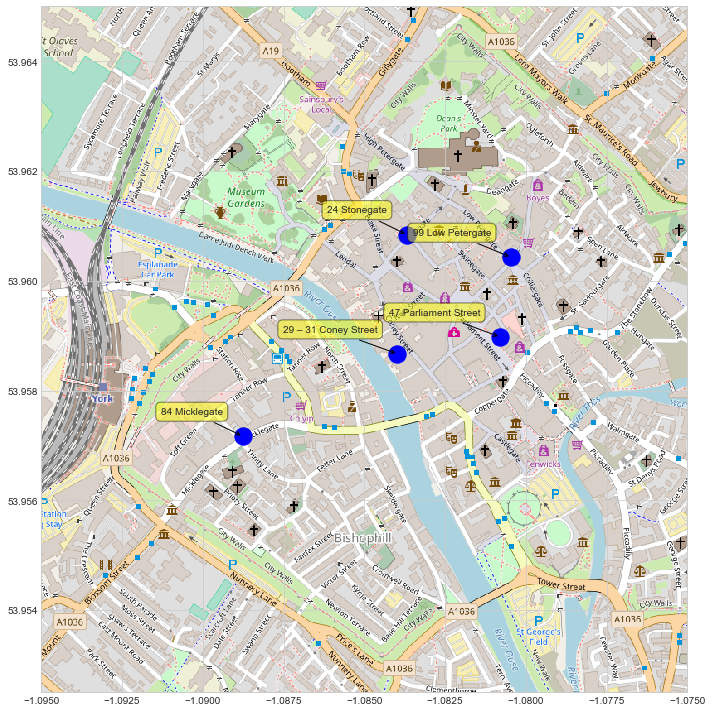

In [7]:
import matplotlib.image as mpimg
fig, ax =plt.subplots(figsize=(10,10))
ax.scatter(camerasloc.X, camerasloc.Y, c='b', s = 300, marker ='o')
#ax = camerasloc.plot(kind = "scatter", x="X", y ="Y",figsize=(10,10), c='b', s = 300, marker ='o', label=camerasloc.CAMERA_LOC )
#ax = camerasloc.plot(kind = "scatter", x="X", y ="Y",figsize=(10,10), c='r', s = 400, marker ='o')
for label, x, y in zip(camerasloc.CAMERA_LOC, camerasloc.X, camerasloc.Y):
    ax.annotate(label,xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
#map_img = mpimg.imread(mypath + 'centermap.png')
map_img = mpimg.imread(mypath + 'yorkcitymap.png')
#map_img = mpimg.imread(mypath + 'map.png')
#map = plt.imshow(map_img, extent=[-1.08908, -1.08058, 53.95684, 53.96108], alpha=0.5, aspect='auto')
map = ax.imshow(map_img, extent=[-1.095, -1.075, 53.9525, 53.965], alpha=1, aspect='auto')
#map = plt.imshow(map_img, extent=[-1.0919,-1.0749, 53.9555, 53.9635], alpha=0.5)

save_fig('CamerasLoc', tight_layout=True, fig_extension="png", resolution=300)

In [8]:
# replace location 'Parliament Street at M&S' with 'Parliament Street' ==> might give some duplicates
footfalldata.loc[footfalldata['LocationName'] == 'Parliament Street at M&S', ['LocationName']] = 'Parliament Street'


In [9]:
streets = footfalldata.LocationName.unique()
print(streets)
stColors = {"Coney Street": 'goldenrod',
            "Parliament Street": 'plum',
            "Church Street": 'dimgray',
            "Micklegate": 'mediumaquamarine',
            "Stonegate": 'lightsalmon'}

['Coney Street' 'Parliament Street' 'Church Street' 'Micklegate'
 'Stonegate']


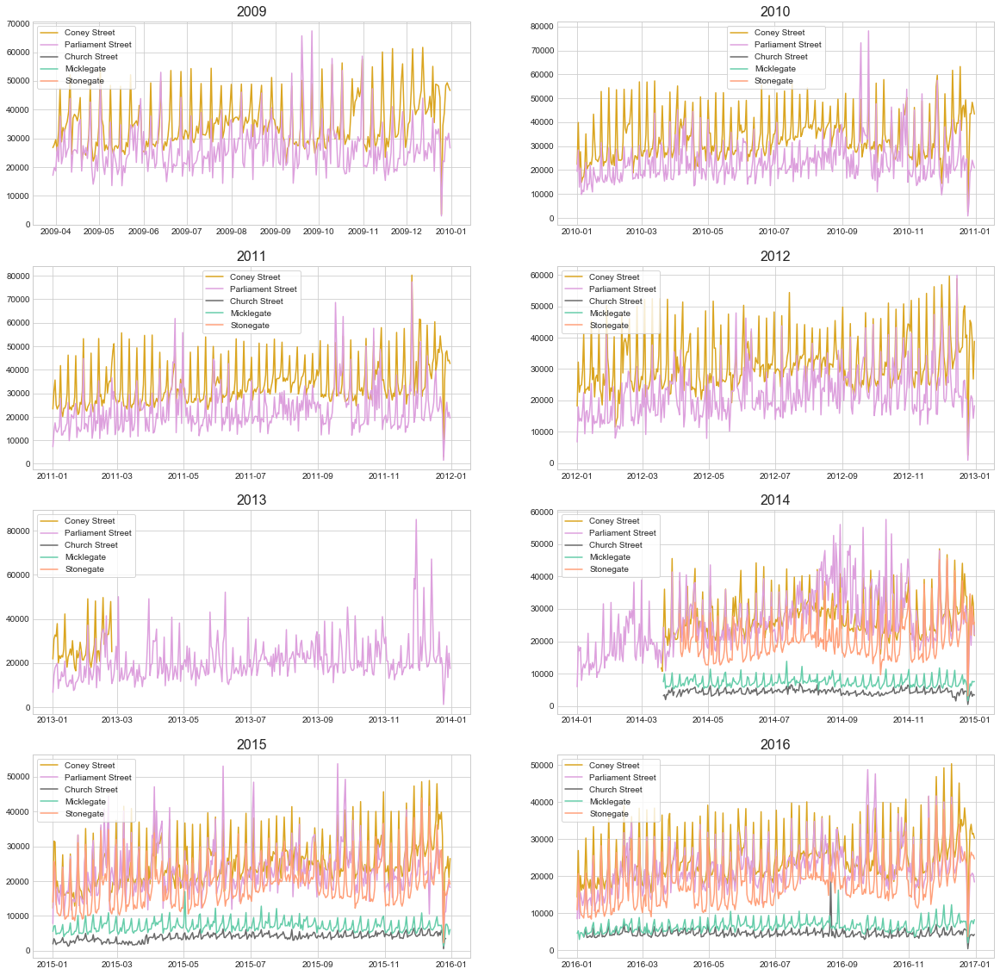

In [10]:
fdf = footfalldata
#x = range(min(f.Date), max(f.Date))
years = range(min(fdf.Date).year, max(fdf.Date).year)
fig, axes = plt.subplots(nrows = int(len(years)/2), ncols = 2, figsize = (20,20))
for i, yr in enumerate(years):
    ax =axes[int(i / 2), i % 2]
    for s in streets:
        fslice = fdf[(fdf.Date.dt.year == yr) &(fdf.LocationName == s)]
        #fslice = fslice.sort_values(['Date'])
        ax.plot(fslice.Date, fslice.TotalCount, label = s, c=stColors.get(s))       
    ax.set_title(str(yr), fontsize = 16)
    leg = ax.legend(frameon=True)


Saving figure Footfall2016


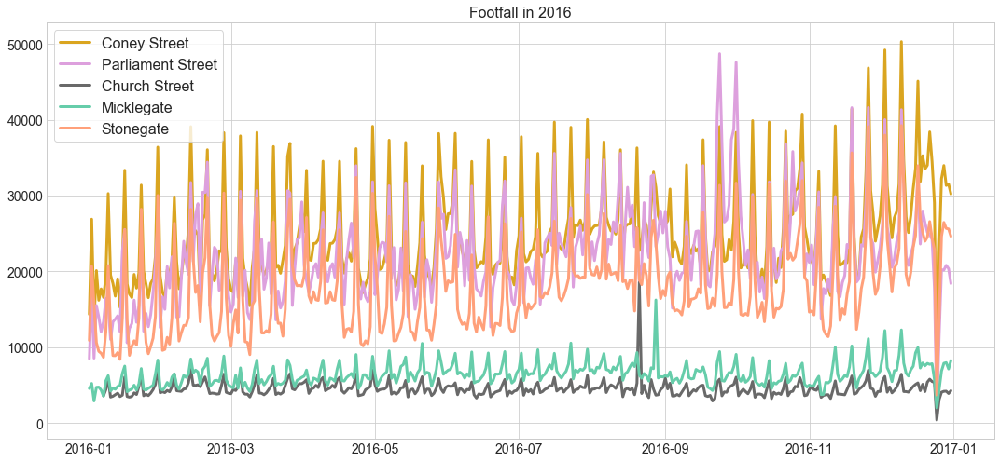

In [11]:
years = range(min(fdf.Date).year, max(fdf.Date).year)
fig, ax = plt.subplots( figsize = (15,7))
for s in streets:
    fslice = fdf[(fdf.Date.dt.year == 2016) &(fdf.LocationName == s)]
    #fslice = fslice.sort_values(['Date'])
    ax.plot(fslice.Date, fslice.TotalCount, label = s, c=stColors.get(s) , linewidth=3)       
leg = ax.legend(frameon=True,fontsize = 16)
#ax.set_yticklabels([5000,10000,20000,30000], fontsize=14)
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
t = ax.set_title("Footfall in 2016",fontsize = 16)
save_fig('Footfall2016', tight_layout=True, fig_extension="png", resolution=300)

Saving figure FootfallMay2017


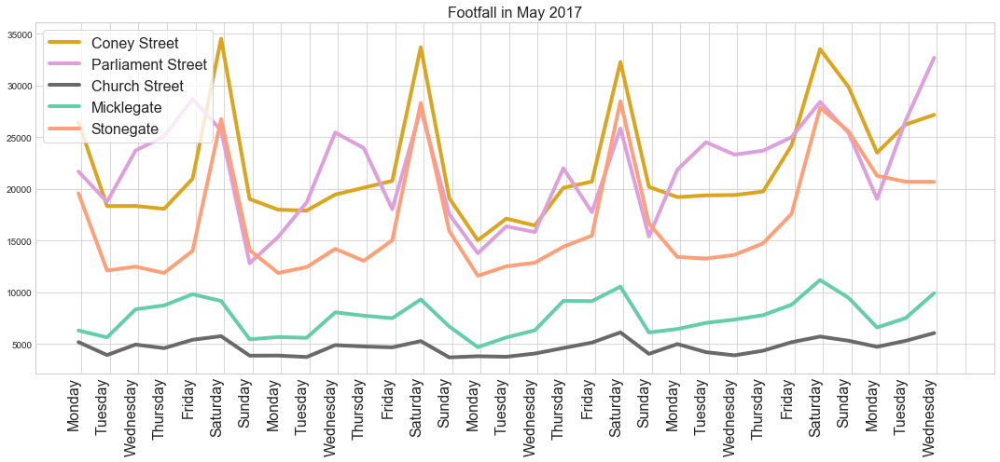

In [12]:
# Zooming in on one street, data has a cyclical nature and depends on weekday - Saturdays are outliers in that respect
mth = 5
yr = 2017
fig, ax = plt.subplots(figsize=(15,7))
for i, s in enumerate(streets):
    fslice = fdf[(fdf.Date.dt.year == yr)  & (fdf.LocationName == s) & (fdf.Date.dt.month == mth)]
    ax.plot(fslice.Date, fslice.TotalCount, label=s, c=stColors.get(s), linewidth=4)       

t = ax.set_title("Footfall in " + dt.date(1900, mth, 1).strftime('%B') +" " + str(yr), fontsize = 16)
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(start+1.6, end+1.6, 1))
#t = ax.set_xticks(np.arange(len(fslice)))
t = ax.set_xticklabels(labels = fslice.WeekDay, rotation='vertical', ha='right', fontsize = 16) 
leg = ax.legend(frameon=True, markerscale=10, loc="upper left",fontsize = 16)

save_fig('FootfallMay2017', tight_layout=True, fig_extension="png", resolution=300)

Saving figure FootfallMissing


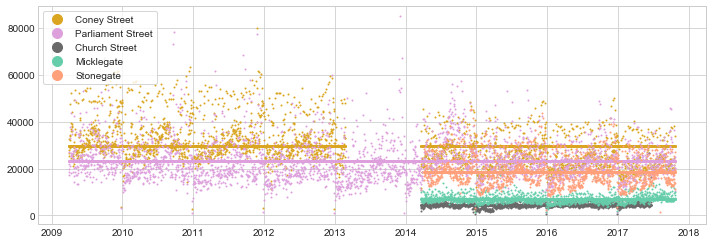

In [13]:
years = range(min(fdf.Date).year, max(fdf.Date).year)
fig, ax = plt.subplots(figsize = (10,3.5))
for i, s in enumerate(streets):
    fslice =fdf[(fdf.LocationName == s)]
    datapts = (i+1) * np.ones(len(fslice))
    #fslice = fslice.sort_values(['Date'])
    meandt = np.mean(fslice.TotalCount)
    ax.plot(fslice.Date, fslice.TotalCount, marker='.', markersize=2,linestyle = 'none', label=s, c=stColors.get(s))       
    ax.plot(fslice.Date, (meandt) *(1+ 0*fslice.TotalCount), marker='.', markersize=3,linestyle = 'none', c=stColors.get(s), label = '_nolegend_')       
    #ax.set_title(str(yr), fontsize = 16)
    leg = ax.legend(frameon=True, markerscale=10, loc="upper left")
    
save_fig('FootfallMissing', tight_layout=True, fig_extension="png", resolution=300)

NA values
Coney Street :  388 N/A value -  Min date: 25, Feb 2013 - Max date: 19, Nov 2014
Parliament Street : No N/A values
Church Street :  11 N/A value -  Min date: 01, Apr 2014 - Max date: 06, Jan 2016
Micklegate : No N/A values
Stonegate : No N/A values
Saving figure FootfallMissing2


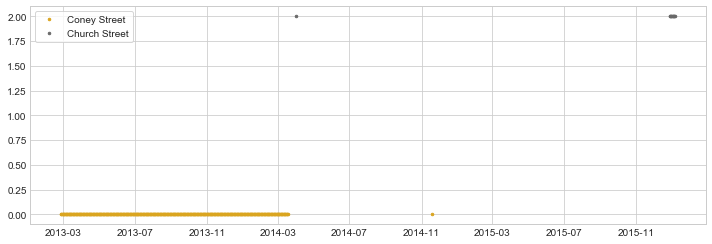

In [14]:
print("NA values")
for i, s in enumerate(streets):
    fslice = fdf[(fdf.LocationName == s) & (fdf['TotalCount'].isnull())]
    if len(fslice)>0:
        mind = "Min date: {:%d, %b %Y}".format(min(fslice.Date))
        maxd = "Max date: {:%d, %b %Y}".format(max(fslice.Date))
        print(s,": ",len(fslice), "N/A value - ", mind, "-", maxd)
    else:
        print(s,": No N/A values")

    
years = range(min(fdf.Date).year, max(fdf.Date).year)
fig, ax = plt.subplots(figsize = (10,3.5))
for i, s in enumerate(streets):
    fslice =fdf[(fdf.LocationName == s)]
    if len(fslice[fslice['TotalCount'].isnull()]) > 0:
        slices = fslice[fslice['TotalCount'].isnull()]
        datapts = (i+1) * np.ones(len(slices))
        ax.plot(slices.Date, (i+ 0*slices.index), marker='.', markersize=5,linestyle = 'none', c=stColors.get(s), label=s)       
    #ax.set_title(str(yr), fontsize = 16)
leg = ax.legend(frameon=True, markerscale=1, loc="upper left")
    
save_fig('FootfallMissing2', tight_layout=True, fig_extension="png", resolution=300)

In [15]:
fslice = fdf[(fdf.LocationName == streets[0]) & (fdf['Date'].dt.year == 2009)  & (fdf.WeekDay == 'Saturday')]
normalise =True
fmin = min(fslice.TotalCount) if normalise else 0
fmax = max(fslice.TotalCount) if normalise else 1
(fslice.TotalCount - fmin)/(fmax - fmin)
len(fslice.TotalCount)


39

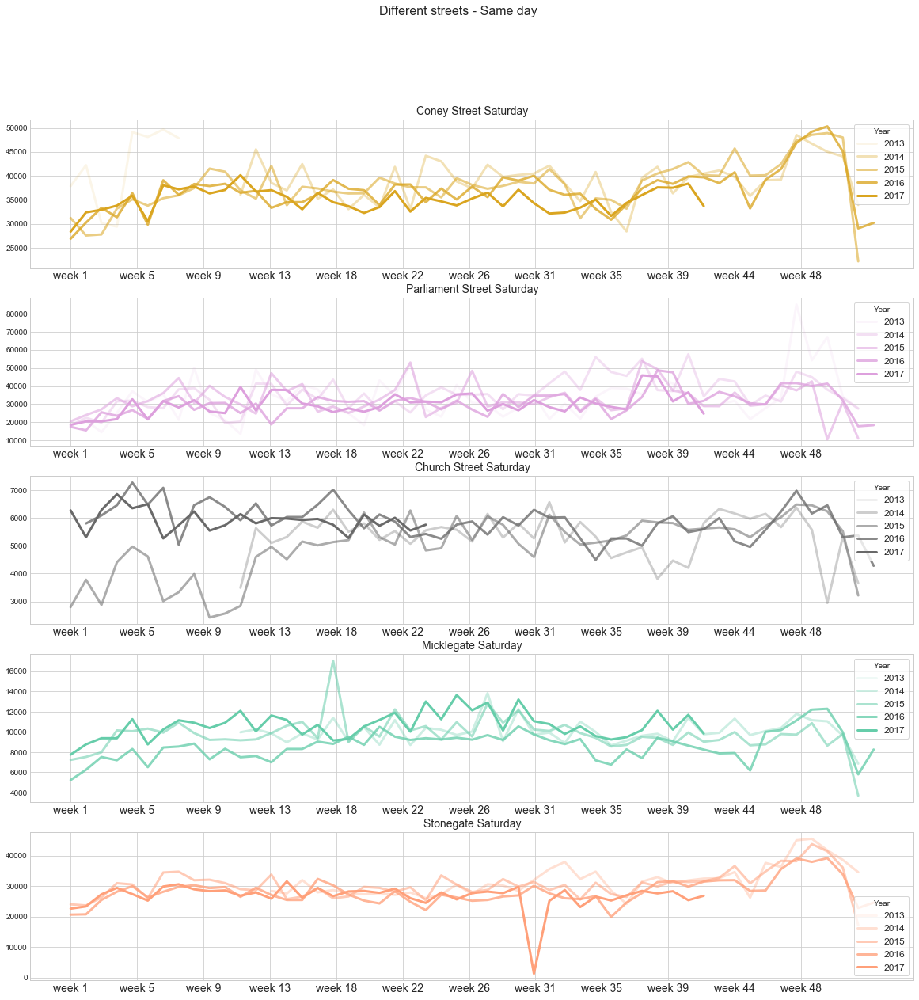

In [16]:
def BRCmod(x):
    if len(x) == 0:
        return x
    elif x[x.index[0]] >= 52:
        return np.arange(1,len(x)+1,1)
    else:
        return x
        

def fwkdayplot(fdf, ax, loc, yr, wkday , alph, clr, normalise=False):
    #ax.set_title(loc+ " " + str(yr) + " " + wkday)
    normtext = ' (normalised)' if normalise else ''
    ax.set_title(loc+ " "+ wkday+normtext, fontsize=14)
    if wkday == "Alldays":
        fslice = fdf[(fdf.LocationName == loc) & (fdf['Date'].dt.year == yr)]
    else:    
        fslice = fdf[(fdf.LocationName == loc) & (fdf['Date'].dt.year == yr)  & (fdf.WeekDay == wkday)]
    x = np.arange(1,len(fslice.TotalCount)+1)
    normalise= normalise & (len(fslice)!=0)
    fmin = min(fslice.TotalCount) if normalise else 0
    fmax = max(fslice.TotalCount) if normalise else 1
    #ax.plot(x,fslice.TotalCount, 'g-', alpha = alph, label = str(yr), c=clr,linewidth=3.0)
    ax.plot(BRCmod(fslice.BRCWeek),(fslice.TotalCount - fmin)/(fmax - fmin), 'g-', alpha = alph, label = str(yr), c=clr,linewidth=3.0)
    #ax.plot(BRCmod(fslice.BRCWeek),fslice.TotalCount, 'g-', alpha = alph, label = str(yr), c=clr,linewidth=3.0)
    #ax.plot(fslice.BRCWeek,fslice.TotalCount, 'g-', alpha = alph, label = str(yr), c=clr,linewidth=3.0)
    t = ax.set_xticks(np.arange(1,52,4.3))
    labels = ["week " + str(int(x)) for x in np.arange(1,52,4.3)]
    ax.set_xticklabels(labels , fontsize = 14) 
    return
#df.sort_values(df.columns[2])
fdf = footfalldata
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday = "Saturday"
fig, axes = plt.subplots(nrows=len(streets), ncols=1,  figsize=(20, 20))
(minyr, maxyr) = (2013,2017)
plt.suptitle("Different streets - Same day", fontsize=16)
for nb, s in enumerate(streets):
    for y in range(minyr, maxyr + 1):
        fwkdayplot(fdf, axes[nb], s, y, weekday, 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, stColors.get(s))
    t = ax.set_xticks(np.arange(len(fslice)))
    #t = axes[nb].set_xticklabels(labels = fslice.WeekDay, fontsize = 14) 
    lg = axes[nb].legend(title="Year",frameon=True, fontsize=12)

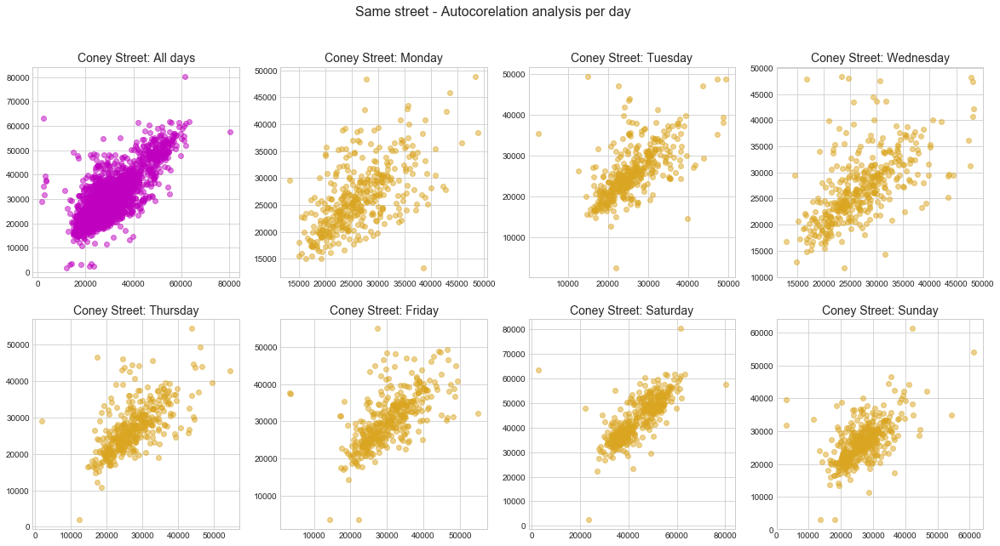

In [17]:
# Data is auto-correlated, particularly on Staurdays
# Plot footfall at time t vs footfall at time t-7 
fig, axes = plt.subplots(nrows=2, ncols=4,  figsize=(20, 10))
plt.suptitle("Same street - Autocorelation analysis per day", fontsize=16)
streetname =streets[0]
fslice = fdf[(fdf.LocationName == streetname)]
axes[0,0].scatter(fslice.TotalCount[7:],fslice.TotalCount[:-7], c='m', alpha = 0.5)
axes[0,0].set_title(streetname+ ": "+ "All days", fontsize=14)
for i, wkd in enumerate(weekdays):
    fslice = fdf[(fdf.LocationName == streetname)  & (fdf.WeekDay == wkd)]
    axes[int((i + 1) /4), (i+1) % 4].scatter(fslice.TotalCount[1:],fslice.TotalCount[:-1], c=stColors.get(streetname), alpha = 0.5)
    axes[int((i + 1) /4), (i+1) % 4].set_title(streetname+ ": "+ wkd, fontsize=14)  

In [18]:
# Outliers
# Scatter plotting function for autocorrelations
def plot_autocorrel(fdf, title):
    fig, axes = plt.subplots(nrows=1, ncols=5,  figsize=(20, 5))
    plt.suptitle(title, fontsize=16)
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):
            fslice = fdf[(fdf.LocationName == s) & (fdf.WeekDay == d)]
            axes[i].scatter(fslice.TotalCount[1:],fslice.TotalCount[:-1], alpha = 0.4, label = d)
        axes[i].set_title(s+ ": "+ "All days", fontsize=16)
    l = plt.legend(frameon = True, loc = "upper left", markerscale=4, fontsize=16)
    return


def plot_autocorrel2(fdf, title):
    fig, axes = plt.subplots(nrows=1, ncols=7,  figsize=(20, 5), sharex=True, sharey=True)
    plt.suptitle(title, fontsize=16)
    for j, d in enumerate(weekdays):
        for i, s in enumerate(streets):
            fslice = fdf[(fdf.LocationName == s) & (fdf.WeekDay == d)]
            axes[j].scatter(fslice.TotalCount[1:],fslice.TotalCount[:-1], alpha = 0.4, label = s, s=3)
        axes[j].set_title(d, fontsize=16)
    handles, labels = axes[j].get_legend_handles_labels()
    fig.legend(handles, labels, loc = (0.07, 0.5), fontsize=16, markerscale=12, frameon = True)
    #l = fig.legend(frameon = True, loc = "upper left",markerscale=6, fontsize=16)
    return

Saving figure Autocorrel1
Saving figure Autocorrel2


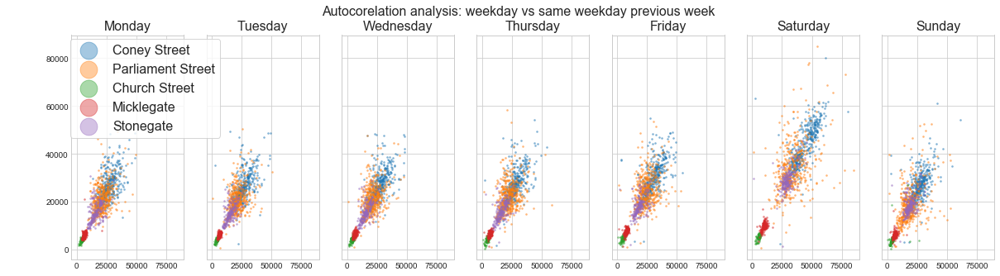

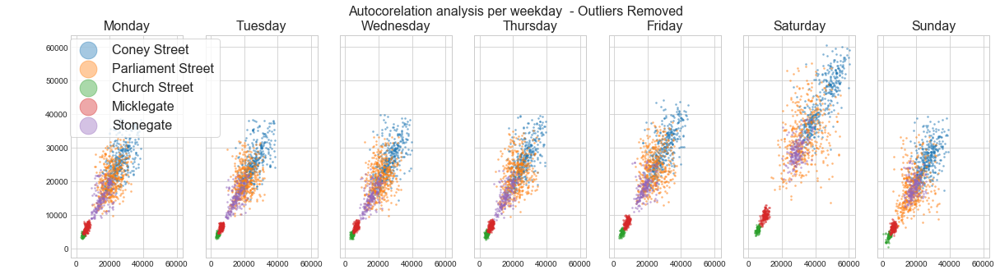

In [19]:
# Determine outliers based on mean and >2 standard deviation for each street and each week day 
# Also create a new column TotalCountLastweek
# plot before and after to check the impact 
fdf = footfalldata
fdf['TotalCountLastWeek'] = 0
fdf['isOutlier'] = 0
outratio = [[0 for x in range(len(streets))] for y in range(len(weekdays))]   # track count of ratio of outliers to total

plot_autocorrel2(fdf,"Autocorelation analysis: weekday vs same weekday previous week")
save_fig('Autocorrel1', tight_layout=False, fig_extension="png", resolution=300)

for i, s in enumerate(streets):
    for j, d in enumerate(weekdays):
        fslice = fdf.loc[(fdf['LocationName'] == s) & (fdf['WeekDay'] == d),:]
        fmean = fslice['TotalCount'].mean()
        fstd = fslice['TotalCount'].std()
        outlist = np.where(abs(fslice['TotalCount'] - fmean) > 2 * fstd, 1, 0)
        fdf.loc[(fdf['LocationName'] == s) & (fdf['WeekDay'] == d),['isOutlier']] = outlist
        fdf.loc[(fdf['LocationName'] == s) & (fdf['WeekDay'] == d),['TotalCountLastWeek']] = fslice.TotalCount.shift(1)        
        outratio[j][i] = outlist.sum() / len(outlist)
        #print(s, d, outlist.sum(),"/",len(outlist), "Outliers")

plot_autocorrel2(fdf.loc[fdf['isOutlier'] == False],"Autocorelation analysis per weekday  - Outliers Removed")

save_fig('Autocorrel2', tight_layout=False, fig_extension="png", resolution=300)

Saving figure Autocorrelone


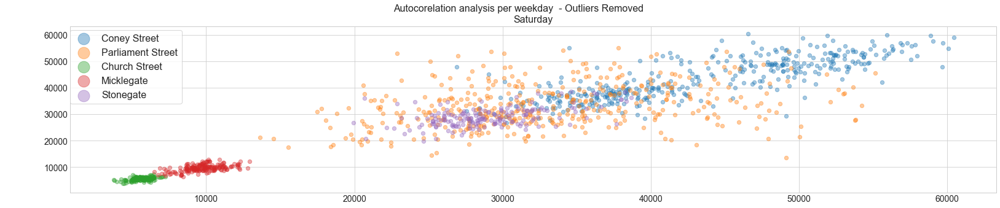

In [20]:
fdf = fdf.loc[fdf['isOutlier'] == False]
title = "Autocorelation analysis per weekday  - Outliers Removed"
fig, axes = plt.subplots(nrows=1, ncols=1,  figsize=(27, 5), sharex=True, sharey=True)
plt.suptitle(title, fontsize=16)
d = weekdays[5]
for i, s in enumerate(streets):
    fslice = fdf[(fdf.LocationName == s) & (fdf.WeekDay == d)]
    axes.scatter(fslice.TotalCount[1:],fslice.TotalCount[:-1], alpha = 0.4, label = s, s=40)
axes.set_title(d, fontsize=16)
handles, labels = axes.get_legend_handles_labels()
fig.legend(handles, labels, loc = (0.07, 0.5), fontsize=16, markerscale=3, frameon = True)
#l = fig.legend(frameon = True, loc = "upper left",markerscale=6, fontsize=16)
for tick in axes.xaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
for tick in axes.yaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
save_fig('Autocorrelone', tight_layout=False, fig_extension="png", resolution=300)

Saving figure cor_coef


/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


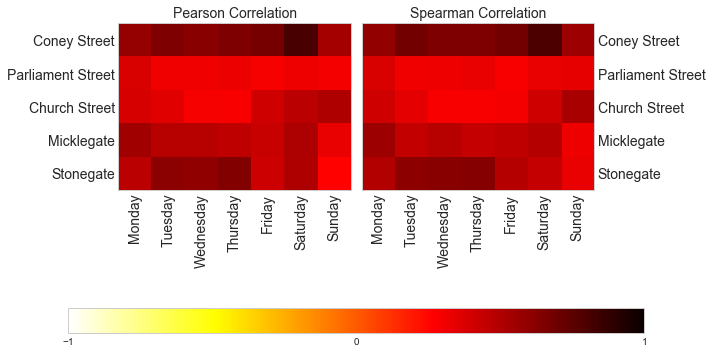

In [21]:
# calculate autocorrelation
import scipy.stats

def calc_autocorrel(fdf, type='Pearson'):
    correl = {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):
            fslice = fdf[(fdf.LocationName == s) & (fdf.WeekDay == d) & ~np.isnan(fdf.TotalCount)]
            if type=='Pearson':
                [correl[i,j], pvalue] = scipy.stats.pearsonr(fslice.TotalCount[1:],fslice.TotalCount[:-1])
            else :
                [correl[i,j], pvalue] = scipy.stats.spearmanr(fslice.TotalCount[1:],fslice.TotalCount[:-1])
    return correl


c = calc_autocorrel(fdf[fdf.isOutlier == 0])
pearson_coef = [[c[i,j] for j,d in enumerate(weekdays)] for i, s in enumerate(streets)]
c = calc_autocorrel(fdf[fdf.isOutlier == 0], type='s')
spearman_coef = [[c[i,j] for j,d in enumerate(weekdays)] for i, s in enumerate(streets)]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,7))
#fig.suptitle('Relative coefficient weights - Lasso Regularisation (top) - No regularisation (bottom)', fontsize=16)

im = axes[0].imshow(pearson_coef, cmap='hot_r',origin='upper', interpolation='nearest', vmin=-1, vmax=1)
axes[0].set_yticks([0,1,2,3,4])
axes[0].set_yticklabels(streets, fontsize=14)
axes[0].set_xticks([0,1,2,3,4,5,6])
axes[0].set_xticklabels(weekdays, fontsize=14, rotation='vertical')
axes[0].set_title('Pearson Correlation', fontsize=14)
axes[0].grid(False)
   # cbar = fig.colorbar(im)#, ticks=[0, 1])
im = axes[1].imshow(spearman_coef, cmap='hot_r',origin='upper', interpolation='nearest', vmin=-1, vmax=1)
axes[1].set_yticks([0,1,2,3,4])
axes[1].set_yticklabels(streets, fontsize=14)
axes[1].yaxis.tick_right()
axes[1].set_xticks([0,1,2,3,4,5,6])
axes[1].set_xticklabels(weekdays, fontsize=14, rotation='vertical')
axes[1].set_title('Spearman Correlation', fontsize=14)
axes[1].grid(False)   


   
fig.subplots_adjust(top=0.9)
cbar_ax = fig.add_axes([0.1, 0.05, 0.8, 0.05])
fig.colorbar(im, cax=cbar_ax, ticks=[-1, 0, 1],orientation='horizontal')

save_fig('cor_coef', tight_layout=True, fig_extension="png", resolution=300)


In [22]:
pd.DataFrame(pearson_coef, index=streets, columns=weekdays)


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.580027,0.651986,0.622807,0.648855,0.675398,0.805173,0.533978
Parliament Street,0.378483,0.305044,0.308722,0.324273,0.293096,0.317628,0.298722
Church Street,0.388206,0.355912,0.294486,0.288347,0.409541,0.474789,0.501295
Micklegate,0.547068,0.479002,0.481606,0.455436,0.434799,0.513073,0.331687
Stonegate,0.472743,0.615905,0.599198,0.639308,0.417028,0.504490,0.264362


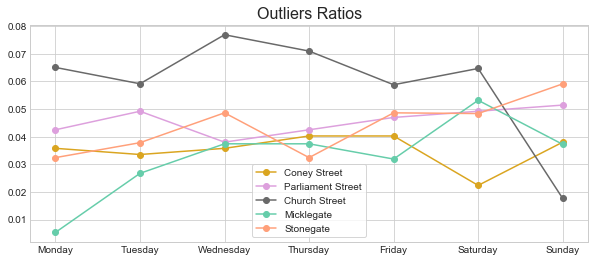

In [23]:
# How many Outliers
fig, ax = plt.subplots(figsize = (10,4))
ax.set_prop_cycle('color', [c for c in stColors.values()])
ax.plot(outratio, marker ='o')
ax.set_xticks(np.arange(len(weekdays)))
t = ax.set_xticklabels(labels = weekdays) 
t = ax.legend(streets, frameon = True, loc = 'best')
t = ax.set_title("Outliers Ratios", fontsize = 16)

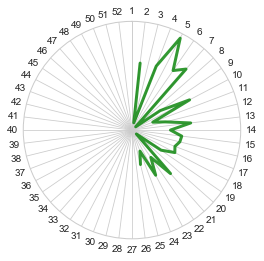

In [24]:
from math import pi

def fwkdayspider(fdf, ax, loc, yr, wkday , alph, clr, normalise=False):
    #ax.set_title(loc+ " " + str(yr) + " " + wkday)
    normtext = '\n' +' (normalised)' if normalise else ''
    ax.set_title(loc+ " "+ wkday+normtext, fontsize=15)
    if wkday == "Alldays":
        fslice = fdf[(fdf.LocationName == loc) & (fdf['Date'].dt.year == yr)]
    else:    
        fslice = fdf[(fdf.LocationName == loc) & (fdf['Date'].dt.year == yr)  & (fdf.WeekDay == wkday)]
    x = np.arange(1,len(fslice.TotalCount)+1)
    normalise= normalise & (len(fslice)!=0)
    fmin = np.min(fslice.TotalCount) if normalise else 0
    fmax = np.max(fslice.TotalCount) if normalise else 1
    spider_plot(ax, BRCmod(fslice.BRCWeek), (fslice.TotalCount - fmin)/(fmax - fmin), str(yr), alph, clr)
    return (fslice.TotalCount - fmin)/(fmax - fmin)

def spider_plot(ax, X, Y, lbl, alph, clr):
    N = len(Y)
    #angles = [n / float(N) * 2 * pi for n in range(N)]
    #angles += angles[:1]
    angles = [x * 2 * pi / 52 for x in sorted(X)]
    #angles += angles[:1]
    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1) 
    ax.set_xticks([n / float(52) * 2 * pi for n in range(53)])
    ax.set_xticklabels(labels= [1+x for x in range(52)])
    # Draw ylabels
    ax.set_rlabel_position(0)
    ax.set_yticks([])
    values = [y for _,y in sorted(zip(X,Y))]
    #values += values[:1]
    ax.plot(angles, values, linewidth=3, linestyle='solid', label=lbl, alpha=alph, c=clr)
    return
                     
ax = plt.subplot(polar=True)
spider_plot(ax, BRCmod(fdf[(fdf.LocationName == streets[2]) & (fdf['Date'].dt.year == 2017) & 
                    (fdf.WeekDay == 'Saturday')].BRCWeek), fdf[(fdf.LocationName == streets[2]) & 
                    (fdf['Date'].dt.year == 2017) & (fdf.WeekDay == 'Saturday')].TotalCount, 'test', 0.8, 'g')
#axes[0][i].set_xticks(np.arange(len(weekdays)))
#t = axes[0][i].set_xticklabels(labels=[x[0:3] for x in weekdays], fontsize=14)



Saving figure polar_yearly


/anaconda3/lib/python3.6/site-packages/matplotlib/projections/polar.py:58: RuntimeWarning: invalid value encountered in less
  mask = r < 0


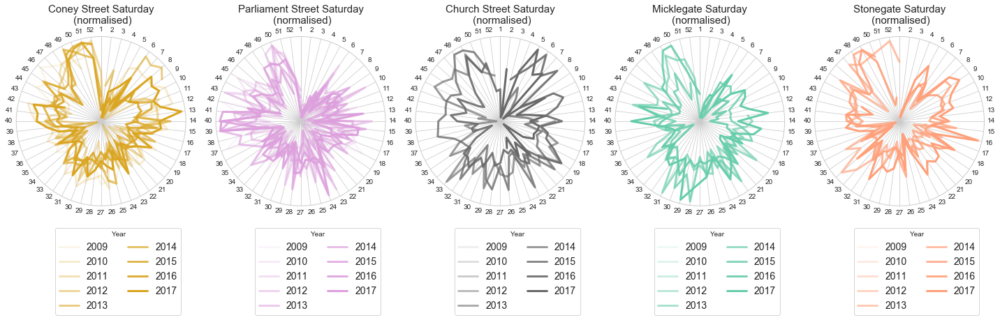

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=len(streets),  figsize=(20,8), subplot_kw=dict(projection='polar'))
(minyr, maxyr) = (2009,2017)
#plt.suptitle("Different streets - Same day", fontsize=16)
for nb, s in enumerate(streets):
    for y in range(minyr, maxyr + 1):
        #for i,d in enumerate(weekdays):
        fwkdayspider(fdf[fdf['isOutlier'] == 0], axes[nb], s, y, 
                   "Saturday", 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, stColors.get(s), normalise=True)
    lg = axes[nb].legend(title="Year",frameon=True, fontsize=14, ncol=2, loc='best', bbox_to_anchor=(1, -0.10))
    #axes[nb].set_xticks( range(51))

save_fig('polar_yearly', tight_layout=True, fig_extension="png", resolution=300)


In [26]:
# create normalised weekly sets (only complete sets)
wklydata = [[]]
for i, s in enumerate(streets):
    wkidx = 0
    wklydata.append([])
    for j, y in enumerate(range(2009,2018)):
        for k, w in enumerate(range(1,53)):
            fslice = fdf[(fdf.LocationName == s) & (fdf.isOutlier == False) & (fdf['Date'].dt.year == y)
                        & (fdf.BRCWeek == w)]
            if (len(fslice) == 7) & ~(np.any(np.isnan(fslice.TotalCount))):          
                #wklydata.setdefault(i, []).append(fslice.TotalCount)
                fmin = np.min(fslice.TotalCount)
                fmax= np.max(fslice.TotalCount)
                wklydata[i].append(np.array((fslice.TotalCount - fmin)/(fmax - fmin)))
                wkidx +=1

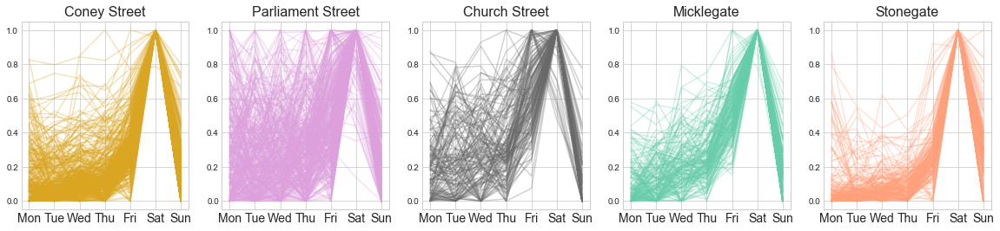

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=len(streets),  figsize=(20,4))
for i, s in enumerate(streets):
    for j in range(len(wklydata[i])):
        axes[i].plot(wklydata[i][j], c=stColors.get(s), alpha =0.3)
    axes[i].set_title(s, fontsize=16)
    axes[i].set_xticks(np.arange(len(weekdays)))
    t = axes[i].set_xticklabels(labels=[x[0:3] for x in weekdays], fontsize=14)


In [28]:
# clustering weeks
from sklearn.cluster import KMeans

kmeans={}
csizes = {}
nbclust = 5

for i, s in enumerate(streets):
    kmeans[i] = KMeans(n_clusters=nbclust, random_state=42).fit(wklydata[i])
    csizes[i] = [sum(kmeans[i].labels_== x) for x in range(nbclust)]            

#kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
#kmeans.labels_
#kmeans.predict([[0, 0], [4, 4]])
#kmeans.cluster_centers_

Saving figure week_clusters


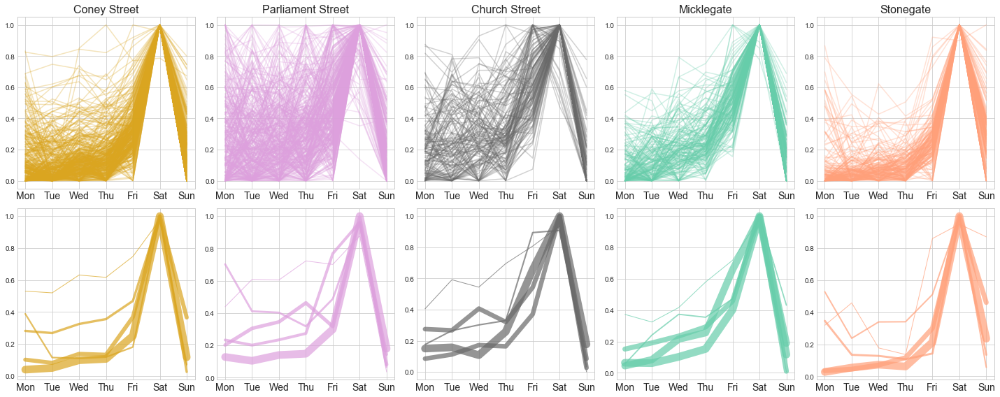

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=len(streets),  figsize=(20,8))
for i, s in enumerate(streets):
    axes[0][i].set_title(s, fontsize=16)   
    for j in range(len(wklydata[i])):
        axes[0][i].plot(wklydata[i][j], c=stColors.get(s), alpha =0.3)
    for j in range(nbclust):
        lw = 1 + 10* (csizes[i][j] - np.min(csizes[i])) / (np.max(csizes[i]) - np.min(csizes[i]))
        axes[1][i].plot(kmeans[i].cluster_centers_[j], c=stColors.get(s), alpha =0.7, linewidth=lw)
    axes[0][i].set_xticks(np.arange(len(weekdays)))
    t = axes[0][i].set_xticklabels(labels=[x[0:3] for x in weekdays], fontsize=14)
    axes[1][i].set_xticks(np.arange(len(weekdays)))
    t = axes[1][i].set_xticklabels(labels=[x[0:3] for x in weekdays], fontsize=14)

save_fig('week_clusters', tight_layout=True, fig_extension="png", resolution=300)
        

In [30]:
t = 'test'
t[0:3]

'tes'

Saving figure Yearlytrends


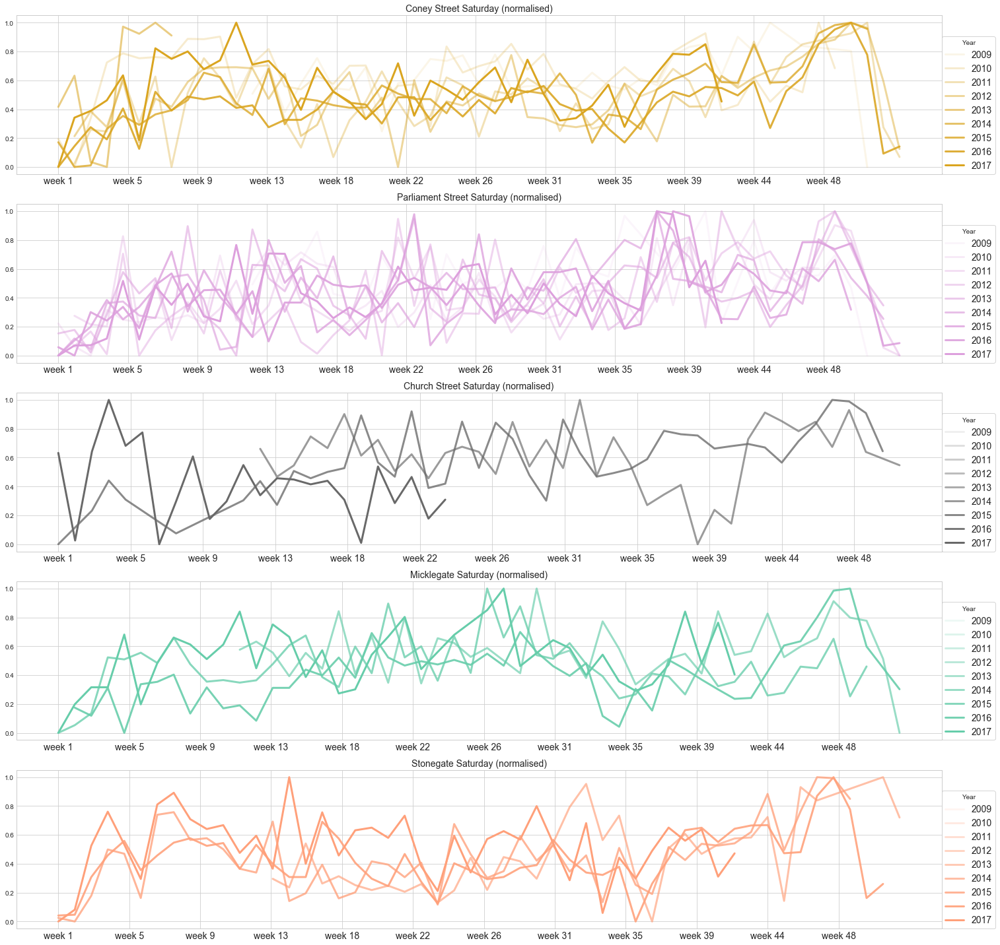

In [31]:
fig, axes = plt.subplots(nrows=len(streets), ncols=1,  figsize=(20, 20))
stlist =  enumerate(streets)
(minyr, maxyr) = (2009,2017)
#plt.suptitle("Different streets - Same day", fontsize=16)
for nb, s in stlist:
    for y in range(minyr, maxyr + 1):
        #for i,d in enumerate(weekdays):
        fwkdayplot(fdf[fdf['isOutlier'] == 0], axes[nb], s, y, 
                   "Saturday", 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, stColors.get(s), normalise=True)
    lg = axes[nb].legend(title="Year",frameon=True, fontsize=14, loc=(1,0))
    
save_fig('Yearlytrends', tight_layout=True, fig_extension="png", resolution=300)

NA values
Coney Street :  388 N/A value -  Min date: 25, Feb 2013 - Max date: 19, Nov 2014
Parliament Street : No N/A values
Church Street :  11 N/A value -  Min date: 01, Apr 2014 - Max date: 06, Jan 2016
Micklegate : No N/A values
Stonegate : No N/A values


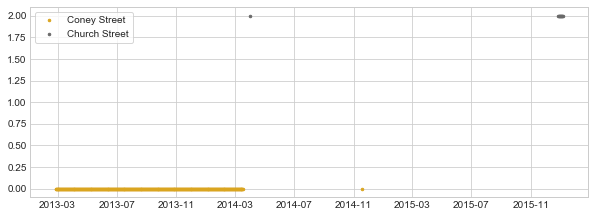

In [32]:
print("NA values")
for i, s in enumerate(streets):
    fslice = fdf[(fdf.LocationName == s) & (fdf['TotalCount'].isnull())]
    if len(fslice)>0:
        mind = "Min date: {:%d, %b %Y}".format(min(fslice.Date))
        maxd = "Max date: {:%d, %b %Y}".format(max(fslice.Date))
        print(s,": ",len(fslice), "N/A value - ", mind, "-", maxd)
    else:
        print(s,": No N/A values")

    
years = range(min(fdf.Date).year, max(fdf.Date).year)
fig, ax = plt.subplots(figsize = (10,3.5))
for i, s in enumerate(streets):
    fslice =fdf[(fdf.LocationName == s)]
    if len(fslice[fslice['TotalCount'].isnull()]) > 0:
        slices = fslice[fslice['TotalCount'].isnull()]
        datapts = (i+1) * np.ones(len(slices))
        ax.plot(slices.Date, (i+ 0*slices.index), marker='.', markersize=5,linestyle = 'none', c=stColors.get(s), label=s)       
    #ax.set_title(str(yr), fontsize = 16)
leg = ax.legend(frameon=True, markerscale=1, loc="upper left")
    


/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:4291: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1856: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1863: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1871: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1872: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)


,Date,SiteName,LocationName,LocationGroup,WeekDay,BRCYear,BRCQuarter,BRCMonth,BRCWeek,InCount,OutCount,TotalCount,BusinessInCount,BusinessOutCount,BusinessTotalCount,FactoredInCount,FactoredOutCount,FactoredTotalCount,TotalCountLastWeek,isOutlier
6854,2016-01-01,York,Church Street,NaN,Friday,2015,NaN,December,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,550.0,0
6859,2016-01-02,York,Church Street,NaN,Saturday,2015,NaN,December,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3213.0,0
6864,2016-01-03,York,Church Street,NaN,Sunday,2015,NaN,December,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3541.0,0
6889,2016-01-04,York,Church Street,NaN,Monday,2016,NaN,January,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6894,2016-01-05,York,Church Street,NaN,Tuesday,2016,NaN,January,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6899,2016-01-06,York,Church Street,NaN,Wednesday,2016,NaN,January,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


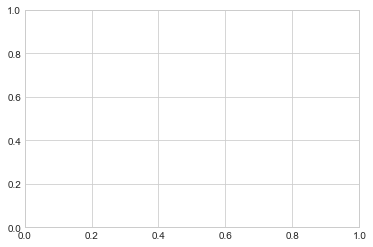

In [33]:
fslice = fdf[(fdf.LocationName == streets[2]) & (fdf['Date'].dt.year == 2016) & (fdf['isOutlier'] == 0)]
np.mean(fslice['TotalCount'])
fig. ax  =plt.subplots()
bp = ax.boxplot(fslice['TotalCount'].values)
fslice[fslice['TotalCount'].isnull()]

Saving figure Boxplots


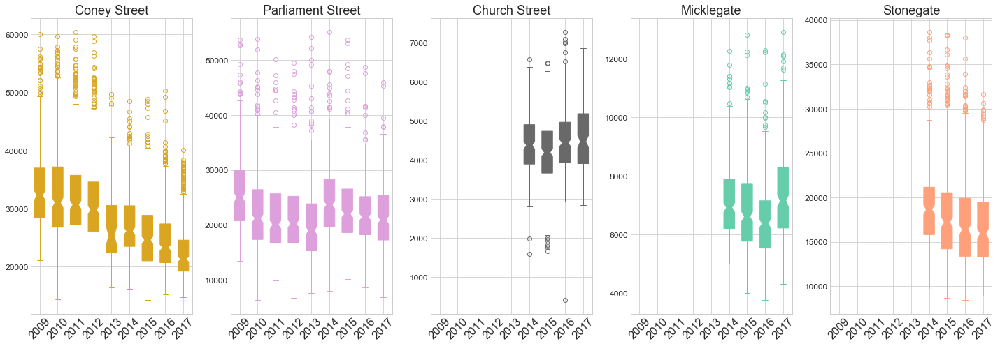

In [34]:
fig, axes = plt.subplots(nrows=1, ncols=len(streets),  figsize=(20, 7)) 
(minyr, maxyr) = (2009,2017)
#plt.suptitle("Yearly boxplot analysis", fontsize=16)
for i, s in enumerate(streets):
    axes[i].set_title(s, fontsize=18)
    for y in range(minyr, maxyr + 1):
        fslice = fdf[(fdf.LocationName == s) & (fdf['Date'].dt.year == y) & (fdf['isOutlier'] == 0)].dropna(subset=['TotalCount'])
        if len(fslice)>0:
            bp = axes[i].boxplot(fslice['TotalCount'].values, positions = [y-minyr], labels=[y], notch=True, patch_artist=True, widths = 0.6)
            for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
                plt.setp(bp[item], color=stColors.get(s))
            plt.setp(bp["boxes"], facecolor=stColors.get(s))
            plt.setp(bp["fliers"], markeredgecolor=stColors.get(s))
    axes[i].set_xlim(-0.5, 8.5)
    axes[i].set_xticks(range(9))
    axes[i].set_xticklabels(range(minyr, maxyr + 1), rotation=45)
    for tick in axes[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(16) 
    for tick in axes[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

save_fig('Boxplots', tight_layout=True, fig_extension="png", resolution=300)

Saving figure Boxplotswith occupancy


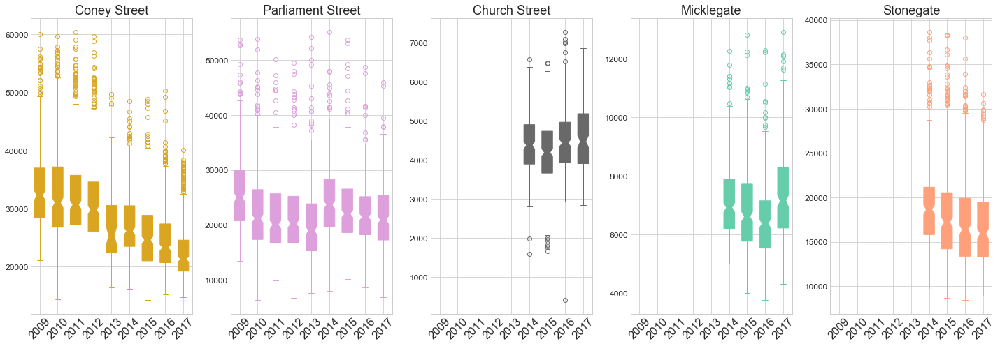

In [35]:
fig, axes = plt.subplots(nrows=1, ncols=len(streets),  figsize=(20, 7)) 
(minyr, maxyr) = (2009,2017)
#plt.suptitle("Yearly boxplot analysis", fontsize=16)
for i, s in enumerate(streets):
    axes[i].set_title(s, fontsize=18)
    for y in range(minyr, maxyr + 1):
        fslice = fdf[(fdf.LocationName == s) & (fdf['Date'].dt.year == y) & (fdf['isOutlier'] == 0)].dropna(subset=['TotalCount'])
        if len(fslice)>0:
            bp = axes[i].boxplot(fslice['TotalCount'].values, positions = [y-minyr], labels=[y], notch=True, patch_artist=True, widths = 0.6)
            for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
                plt.setp(bp[item], color=stColors.get(s))
            plt.setp(bp["boxes"], facecolor=stColors.get(s))
            plt.setp(bp["fliers"], markeredgecolor=stColors.get(s))
    axes[i].set_xlim(-0.5, 8.5)
    axes[i].set_xticks(range(9))
    axes[i].set_xticklabels(range(minyr, maxyr + 1), rotation=45)
    for tick in axes[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(16) 
    for tick in axes[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

save_fig('Boxplotswith occupancy', tight_layout=True, fig_extension="png", resolution=300)

In [36]:
# Create a new column DaysToXmas
#Could be done in the transformation pipeline
#fdf['DaysToXmas'] = fdf['Date']
fdf['DaysToXmas'] = fdf['Date'].dt.date
(minyr, maxyr) = (2009,2017)
for y in range(minyr, maxyr + 1):
    Xmasday = dt.date(y,12,25)
    fdf.loc[fdf['Date'].dt.year == y,['DaysToXmas']] = (Xmasday - fdf.loc[fdf['Date'].dt.year == y,['DaysToXmas']])

fdf.DaysToXmas = fdf.DaysToXmas.transform(lambda x: x.days)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:537: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:3643: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pan

In [37]:
weatherdata.describe()

,Temp_Ave,Temp_Min,Temp_Max,Wind_Ave,Wind_Max,Dir,Press_Min,Press_Max,Rain,Hum_Min,Hum_Max,Wind_Chill
count,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000
mean,10.095990,6.816077,13.475506,7.185694,21.770882,159.659682,1004.124675,1012.714993,1.508895,59.275289,89.643931,22.293064
std,5.057425,4.974988,5.902869,4.878560,14.018174,106.129098,35.859915,10.236549,3.512088,14.054181,4.921140,38.234522
min,-7.700000,-36.800000,-3.200000,0.000000,0.000000,0.000000,0.000000,970.300000,0.000000,0.000000,68.900000,-17.600000
25%,6.300000,3.200000,9.200000,4.400000,14.575000,56.000000,998.300000,1006.900000,0.000000,48.600000,86.700000,0.200000
50%,10.300000,7.000000,13.400000,7.100000,22.400000,186.000000,1006.750000,1013.300000,0.115000,58.400000,90.600000,6.200000
75%,14.200000,10.700000,17.900000,10.100000,30.400000,243.000000,1013.400000,1019.300000,1.292500,69.200000,93.300000,12.400000
max,23.500000,18.600000,49.900000,27.200000,71.800000,358.000000,1036.100000,1056.400000,50.670000,97.600000,100.000000,100.000000


Saving figure WeatherData


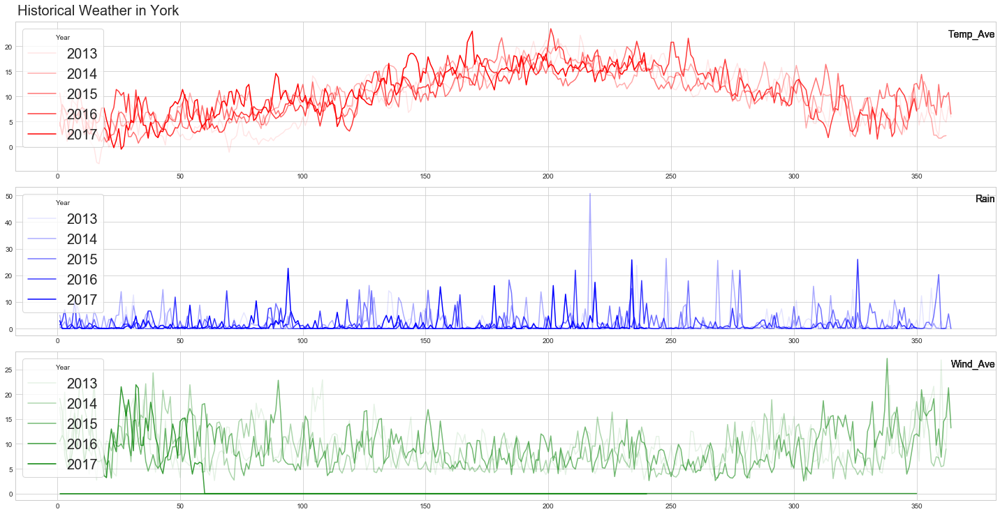

In [38]:
# Dealing with weather data
# Wind data is unusable
wdf = weatherdata
fig, axes = plt.subplots(nrows=3, ncols=1,  figsize=(20, 10))
plt.suptitle("Historical Weather in York", fontsize=20, x=0.1, y=1.02)
(minyr, maxyr) = (2013,2017)
wcol= ['Temp_Ave', 'Rain', 'Wind_Ave']
cols = ['r', 'b', 'g']
for nb in [0,1,2]:
    for y in range(minyr, maxyr+1):
        wslice = wdf[(wdf['Date'].dt.year == y)]
        x = np.arange(1,len(wslice)+1)
        axes[nb].plot(x, wslice[wcol[nb]], c=cols[nb], alpha = 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, label = str(y))
        axes[nb].text(1.0,0.9,wcol[nb],horizontalalignment='right',transform=axes[nb].transAxes, fontsize=14)
        #axes[nb].set_title(wcol[nb], fontsize=14)
        lg = axes[nb].legend(title="Year",frameon=True, fontsize=20, loc = 2)

save_fig('WeatherData', tight_layout=True, fig_extension="png", resolution=300)

Saving figure WeatherData Conso


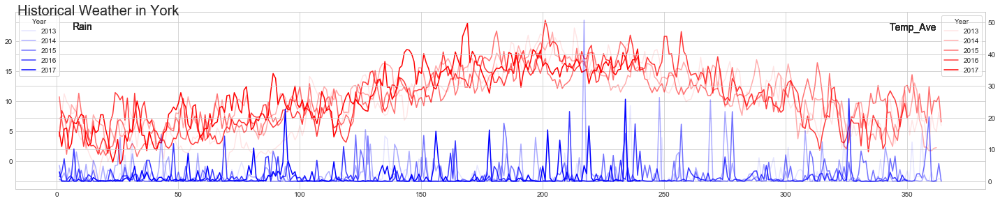

In [39]:
# Dealing with weather data
# Wind data is unusable
wdf = weatherdata
fig, axes = plt.subplots(figsize=(20, 4))
plt.suptitle("Historical Weather in York", fontsize=20, x=0.1, y=1.0)
(minyr, maxyr) = (2013,2017)
wcol= ['Temp_Ave', 'Rain', 'Wind_Ave']
cols = ['r', 'b', 'g']
nb=0
for y in range(minyr, maxyr+1):
    wslice = wdf[(wdf['Date'].dt.year == y)]
    x = np.arange(1,len(wslice)+1)
    axes.plot(x, wslice[wcol[nb]], c=cols[nb], alpha = 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, label = str(y))
    axes.text(0.95,0.9,wcol[nb],horizontalalignment='right',transform=axes.transAxes, fontsize=14)
    #axes[nb].set_title(wcol[nb], fontsize=14)
    lg = axes.legend(title="Year",frameon=True, fontsize=10, loc = 1)
nb=1
axes2 = axes.twinx()
for y in range(minyr, maxyr+1):
    wslice = wdf[(wdf['Date'].dt.year == y)]
    x = np.arange(1,len(wslice)+1)
    axes2.plot(x, wslice[wcol[nb]], c=cols[nb], alpha = 0.9 * (y - minyr) / (maxyr - minyr) + 0.1, label = str(y))
    axes2.text(0.08,0.9,wcol[nb],horizontalalignment='right',transform=axes.transAxes, fontsize=14)
    #axes[nb].set_title(wcol[nb], fontsize=14)
    lg = axes2.legend(title="Year",frameon=True, fontsize=10, loc = 2)

save_fig('WeatherData Conso', tight_layout=True, fig_extension="png", resolution=300)

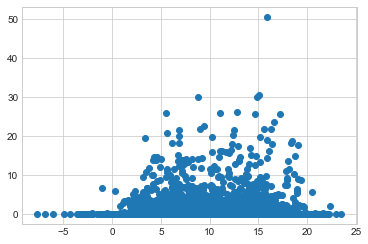

In [40]:
plt.scatter(wdf.Temp_Ave,wdf.Rain)

In [41]:
# Dealing with NNDR data
ndf = nndrdata
# Remove unnecessary data to keep only the 5 streets and commercial premises
# delete unnecessary columns
keeplist = ['SnapshotDate', 'Classification', 'LiableName', 'AnalysisDescription', 'PropertyAddress', 'Occupied_Empty_Flooded']
droplist = list(set(list(ndf)) - set(keeplist))
for col in droplist:
    try:
        ndf.drop(col, axis=1, inplace=True)
    except:
        print("already done")
#remove unnecessary lines
try:
    ndf.drop(nndrdata[ndf.Classification.str.strip() != 'Company'].index, inplace=True)  #remove non-companies
    ndf.drop(nndrdata[~ndf['PropertyAddress'].str.contains('|'.join(streets))].index,  inplace=True) # keep the streets we are looking for
except:
    print("already done")
ndf.SnapshotDate = pd.to_datetime(ndf.SnapshotDate)

In [42]:
#re-arrange the Business Rates data: replace PropertyAddress with LocationName     
for s in streets:
    try:
        idx = ndf['PropertyAddress'].str.contains(s)
        ndf.loc[idx,'PropertyAddress'] = s
    except:
        print("already done")
ndf.rename(columns = {'PropertyAddress':'LocationName'}, inplace = True)
ndf.rename(columns = {'SnapshotDate':'Date'}, inplace = True)

Saving figure OccupancyData


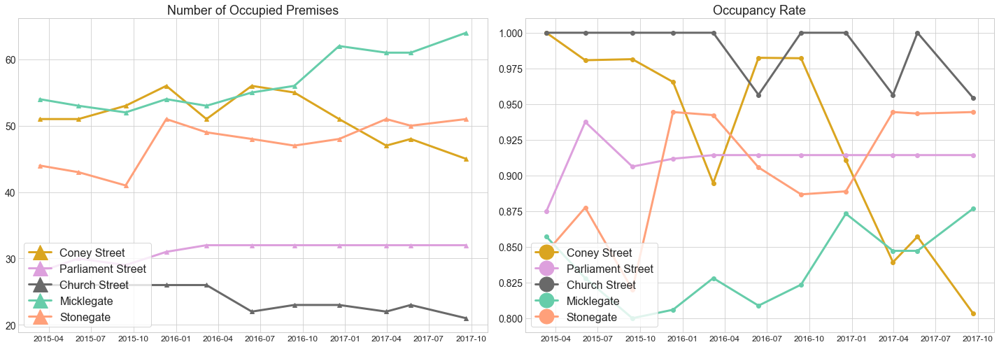

In [43]:
### Create time series with the number of occupied/empty premises and occupancy rates for each available day and each street
occdata = pd.DataFrame({'Date': [], 'LocationName': [], 'NbEmpty': [], 'NbOcc': [], 'OccRate': []})
ndates = ndf.Date.unique()
for d in ndates:
    for s in streets:
        nbocc = len(ndf[(ndf.LocationName == s) & (ndf.Occupied_Empty_Flooded.str.strip() == 'Occupied') & (ndf.Date == d)])
        nbemp = len(ndf[(ndf.LocationName == s) & (ndf.Occupied_Empty_Flooded.str.strip() != 'Occupied') & (ndf.Date == d)])
        occdata.loc[len(occdata)] = [d, s, nbemp, nbocc, nbocc/ (nbocc + nbemp)]  

        
        
# Plot the data 
# There were floods in York city center in December 2015
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 7))
for s in streets:
    axes[0].plot(occdata[occdata['LocationName'] == s].Date, occdata[occdata['LocationName'] == s].NbOcc, label = s, marker = "^", c=stColors.get(s),linewidth=3.0)
    axes[1].plot(ndates, occdata[occdata['LocationName'] == s].OccRate, label = s, marker = "o", c=stColors.get(s),linewidth=3.0)

axes[0].set_title(label = "Number of Occupied Premises", fontsize=18)
axes[1].set_title(label = "Occupancy Rate", fontsize=18)
lg = axes[0].legend(frameon=True, fontsize=16, loc = 'lower left',markerscale=3.5)
lg = axes[1].legend(frameon=True, fontsize=16, loc = 'lower left',markerscale=3.5)
for tick in axes[0].yaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
for tick in axes[1].yaxis.get_major_ticks():
    tick.label.set_fontsize(14) 
for tick in axes[0].xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
for tick in axes[1].xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 

save_fig('OccupancyData', tight_layout=True, fig_extension="png", resolution=300)

In [44]:
# Currently data starts in Apr 2015
# we complete the serie by starting in Jan 2015 with the same values as in April
odf = occdata
strd = pd.to_datetime(dt.datetime(2015,1,1))
endd = min(max(fdf.Date), max(wdf.Date), max(ndf.Date))
for s in streets:
    oslice = odf.loc[odf['LocationName'] == s,:]
    if (min(oslice.Date) > strd):
        odf.loc[len(odf)] = oslice.iloc[0]
        odf.iloc[len(odf) -1,odf.columns.get_loc('Date')] = strd
# Reorder
odf = odf.sort_values(by='Date')
odf = odf.reset_index(drop=True)

# We upsample the time series to have the required data sequentially, by linearly interpolating between points
tempo = odf.set_index('Date')           # Save the occupancy rate dataframe and set date as an index
odf = pd.DataFrame(columns=odf.columns) # Empty the dataframe, we will refill it
for i, s in enumerate(streets):
    tslice = tempo.loc[tempo['LocationName'] == s,:]
    tslice = tslice.resample("D").interpolate(method='linear')  # Upsampling happens here
    tslice.LocationName = s
    tslice.reset_index(level=0, inplace=True)
    odf = pd.concat([tslice, odf])
# Reorder by date
odf = odf.sort_values(by='Date')
odf = odf.reset_index(drop=True)

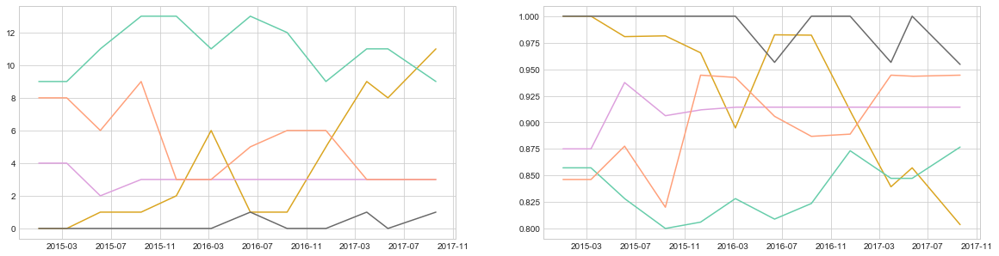

In [45]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 5))
for s in streets:
    axes[0].plot(odf[odf['LocationName'] == s].Date, odf[odf['LocationName'] == s].NbEmpty, label = s, c=stColors.get(s))
    axes[1].plot(odf[odf['LocationName'] == s].Date, odf[odf['LocationName'] == s].OccRate, label = s, c=stColors.get(s))


In [46]:
for y in range(minyr, maxyr + 1):
    oslice = odf[(odf['LocationName'] == s) & (odf['Date'].dt.year == y)].OccRate
    if (len(oslice)>0): 
        avgeOccRate[y-minyr] = np.mean(oslice) 
y = avgeOccRate   
x =range(minyr, maxyr+1)
plt.plot(x,y)

NameError: name 'avgeOccRate' is not defined

Saving figure Boxplotswith occupancy


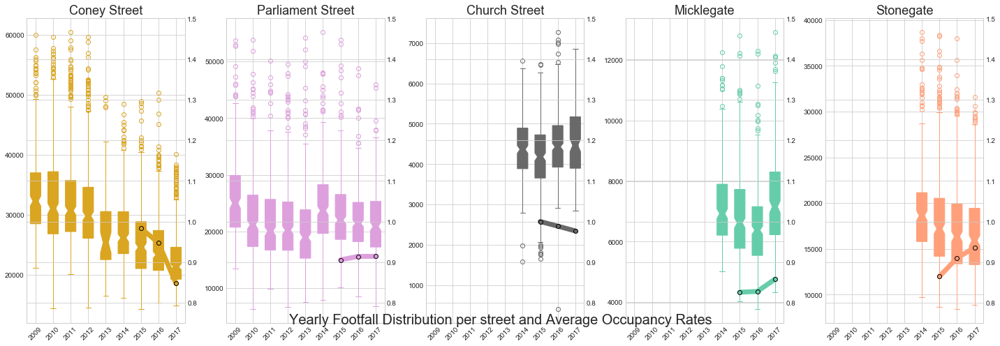

In [47]:
fig, axes = plt.subplots(nrows=1, ncols=len(streets),  figsize=(20, 7)) 
#fig, axes = plt.subplots(nrows=2, ncols=len(streets),  figsize=(20, 7),gridspec_kw = {'height_ratios':[3,1]}) 
(minyr, maxyr) = (2009,2017)
axes2=axes

#plt.suptitle("Yearly boxplot analysis", fontsize=16)
for i, s in enumerate(streets):
    axes[i].set_title(s, fontsize=18)
    avgeOccRate = []
    x=[]
    for y in range(minyr, maxyr + 1):
        fslice = fdf[(fdf.LocationName == s) & (fdf['Date'].dt.year == y) & (fdf['isOutlier'] == 0)].dropna(subset=['TotalCount'])
        oslice = odf[(odf['LocationName'] == s) & (odf['Date'].dt.year == y)].OccRate
        if (len(oslice)>0): 
            avgeOccRate.append(np.mean(oslice))
            x.append(y-minyr)
        if len(fslice)>0:
            bp = axes[i].boxplot(fslice['TotalCount'].values, positions = [y-minyr], labels=[y], notch=True, patch_artist=True, widths = 0.6)
            for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
                plt.setp(bp[item], color=stColors.get(s))
            plt.setp(bp["boxes"], facecolor=stColors.get(s))
            plt.setp(bp["fliers"], markeredgecolor=stColors.get(s))
    axes[i].set_xlim(-0.5, 8.5)
    axes[i].set_xticks(range(9))
    axes[i].set_xticklabels(range(minyr, maxyr + 1), rotation=45)
    axes2[i] = axes[i].twinx()
    axes2[i].plot(x, avgeOccRate, label = s, marker = "o", c=stColors.get(s),linewidth=7.0, MarkerEdgeColor='k')
    axes2[i].set_ylim(0.75, 1.5)
    axes2[i].set_xticks(range(9))
    for tick in axes[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(16) 
    for tick in axes[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 
plt.suptitle("Yearly Footfall Distribution per street and Average Occupancy Rates", fontsize=20, y=0.1)
save_fig('Boxplotswith occupancy', tight_layout=True, fig_extension="png", resolution=300)

In [48]:
#Cleaning up before merge/joins
#Remove columns with non-predictive features
def drop_cols(df, keeplist):
    droplist = list(set(list(df)) - set(keeplist))
    for col in droplist:
        try:
            df.drop(col, axis=1, inplace=True)
        except:
            print("already done")
    return
# We remove Week and Month information as this is completely encapsulated into DaysToXmas
# Added benefit of removing 2 categorical variables and reducing overall dimensionality
# Drawback, we might have some issues aroung yeareand and NewYear
keeplist = ['Date', 'LocationName', 'WeekDay', 'DaysToXmas', 'TotalCount', 'TotalCountLastWeek', 'isOutlier']
drop_cols(fdf, keeplist)
fdf = fdf.dropna()  #remove entries with missing TotalCountLastWeek
keeplist = ['Date', 'Temp_Ave', 'Rain']
drop_cols(wdf, keeplist)
keeplist = ['Date', 'LocationName', 'OccRate']
drop_cols(odf, keeplist)



/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [49]:
# Merge footfall data with weather data
Fdf = pd.merge(fdf, wdf, left_on='Date', right_on='Date')
# Add occupancy rates (this will give plenty of N/A rows but we can select them out)
Fdf = pd.merge(Fdf, odf, on=['Date','LocationName'], how = 'left')

#Fodf = pd.merge(Fdf, odf, on=['Date','LocationName'])
# Drop all entries with either data missing
#Fdf = Fdf.dropna()
#Fodf = Fodf.dropna()



Saving figure Dataset Sizes


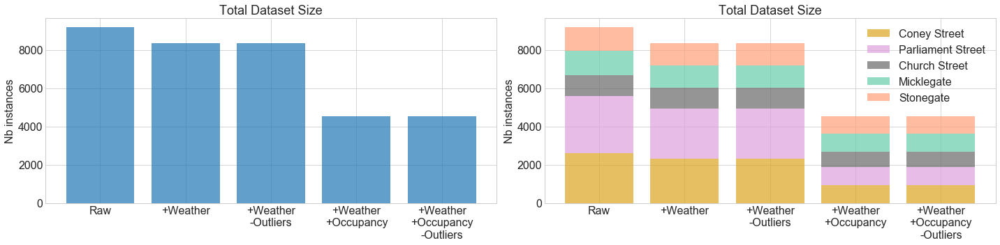

In [50]:
#How much are we trimming away?
dsize = [len(fdf), len(Fdf), len(Fdf[Fdf.isOutlier != 1]), len(Fdf.dropna()), len(Fdf[Fdf.isOutlier != 1].dropna())]
dlabel =["Raw", "+Weather", "+Weather\n-Outliers","+Weather\n+Occupancy", "+Weather\n+Occupancy\n-Outliers"]

fig, [ax1, ax2]  = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
idx = np.arange(len(dsize))
l = ax1.bar(idx, dsize, alpha =0.7)

#pm.set_facecolor('r')
ax1.set_xticks(idx)
t = ax1.set_xticklabels(dlabel, fontsize = 16)
t = ax1.set_ylabel('Nb instances', fontsize = 16)
t = ax1.set_title('Total Dataset Size', fontsize = 18)


dsizes ={}
l2 = {}
bottom = np.zeros(5)
for i, s in enumerate(streets):
    dsizes[i] = [len(fdf[fdf.LocationName == s]), 
                 len(Fdf[Fdf.LocationName == s]), 
                 len(Fdf[(Fdf.isOutlier != 1) & (Fdf.LocationName == s)]), 
                 len(Fdf[(Fdf.LocationName == s)].dropna()), 
                 len(Fdf[(Fdf.isOutlier != 1) & (Fdf.LocationName == s)].dropna())]
    l2[i] = ax2.bar(idx, dsizes[i], alpha =0.7, color=stColors.get(s),bottom=bottom)
    bottom += dsizes[i]

ax2.set_xticks(idx)
t = ax2.set_xticklabels(dlabel, fontsize = 16)
t = ax2.set_ylabel('Nb instances', fontsize = 16)
t = ax2.set_title('Total Dataset Size', fontsize = 18)
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(16) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(16) 
l= plt.legend([l2[x] for x in range(5)], streets, markerscale=5, fontsize=16)
#Each street
#fig, axes = plt.subplots(nrows=len(streets), ncols=1,  figsize=(20, 5))
save_fig('Dataset Sizes', tight_layout=True, fig_extension="png", resolution=300)


In [51]:
[l2[x] for x in range(5)]

[<Container object of 5 artists>,
 <Container object of 5 artists>,
 <Container object of 5 artists>,
 <Container object of 5 artists>,
 <Container object of 5 artists>]

Saving figure Histograms


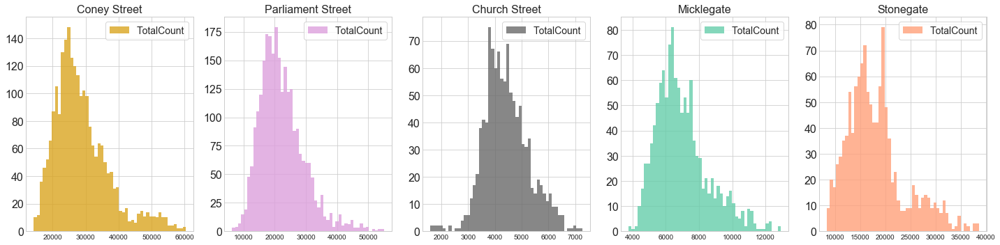

In [52]:
def plot_hist(df, field, nbins=50):
    fig, axes = plt.subplots(nrows=1, ncols=5,  figsize=(20, 5))
    #plt.suptitle("Histograms for: " + field, fontsize=16)
    for i, s in enumerate(streets):
        dfslice = df[(df.LocationName == s)]
        axes[i].hist(dfslice[field] , nbins, alpha=0.8, color=stColors.get(s))
        axes[i].set_title(s, fontsize=16)
        for tick in axes[i].xaxis.get_major_ticks():
            tick.label.set_fontsize(10) 
        for tick in axes[i].yaxis.get_major_ticks():
            tick.label.set_fontsize(16) 
        l = axes[i].legend(frameon=True, loc="upper right", fontsize=14)
    return

plot_hist(Fdf, 'TotalCount')
#plot_hist(Fdf,  'DaysToXmas')
#plot_hist(Fdf,  'Temp_Ave')
#plot_hist(Fdf,  'Rain')

#Fdf[Fdf.LocationName == s].hist(figsize=(10,7))
save_fig('Histograms', tight_layout=True, fig_extension="png", resolution=300)


In [53]:
#Split the data into a training and a test set
from sklearn.model_selection import StratifiedShuffleSplit

trainRatio = 0.7
stSplit = StratifiedShuffleSplit(n_splits = 1, test_size = 1-trainRatio, random_state=42)
# splitting so that relative proportions of weekdays is preserved

for idxTrain, idxTest in stSplit.split(Fdf ,Fdf["WeekDay"]):  
    Traindf = Fdf.loc[idxTrain]
    Testdf  = Fdf.loc[idxTest]
  
    
# Check that the relative proportion of instances is preserved
FdFqTable = {'Weekdays': list(weekdays) + ['Alldays']}
TrFqTable = {'Weekdays': list(weekdays) + ['Alldays']}
nbAll = len(Fdf)
nbTrain = len(Traindf)
for s in streets:
    FdFqTable[s] = [0]*8
    TrFqTable[s] = [0]*8
    for j, d in enumerate(weekdays): 
        fslice = Fdf.loc[(Fdf['LocationName'] == s) & (Fdf['WeekDay'] == d),:]
        trslice = Traindf.loc[(Traindf['LocationName'] == s) & (Traindf['WeekDay'] == d),:]
        FdFqTable[s][j] =  100* len(fslice) / nbAll
        TrFqTable[s][j] =  100* len(trslice) / nbTrain
    FdFqTable[s][7] = sum(FdFqTable[s])
    TrFqTable[s][7] = sum(TrFqTable[s])
for i in range(8):
    FdFqTable['All Streets'] = sum([FdFqTable[s][i] for s in streets])
    TrFqTable['All Streets'] = sum([TrFqTable[s][i] for s in streets])

FdFqTable = pd.DataFrame(FdFqTable)  
TrFqTable = pd.DataFrame(TrFqTable)    

    
# Transform WeekDay into 7 categorical columns
Traindf = pd.get_dummies(Traindf, columns =['WeekDay'])
Testdf = pd.get_dummies(Testdf, columns =['WeekDay'])
Fulldf = pd.get_dummies(Fdf, columns =['WeekDay'])
columnslist = Traindf.columns.tolist()
        
#Sort resulting arrays
Traindf = Traindf.sort_values(by='Date')
Testdf = Testdf.sort_values(by='Date')      
Fulldf = Fulldf.sort_values(by='Date')    

In [54]:
pd.options.display.float_format = '{:,.2f}'.format
display(Traindf)

,Date,LocationName,TotalCount,TotalCountLastWeek,isOutlier,DaysToXmas,Temp_Ave,Rain,OccRate,WeekDay_Friday,WeekDay_Monday,WeekDay_Saturday,WeekDay_Sunday,WeekDay_Thursday,WeekDay_Tuesday,WeekDay_Wednesday
0,2010-01-01,Parliament Street,"19,413.00","2,986.00",0,358,-0.20,0.00,nan,1,0,0,0,0,0,0
3,2010-01-02,Coney Street,"39,884.00","34,473.00",0,357,0.30,0.03,nan,0,0,1,0,0,0,0
2,2010-01-02,Parliament Street,"28,375.00","22,123.00",0,357,0.30,0.03,nan,0,0,1,0,0,0,0
5,2010-01-03,Coney Street,"20,145.00","38,863.00",0,356,-1.30,0.00,nan,0,0,0,1,0,0,0
4,2010-01-03,Parliament Street,"12,857.00","21,847.00",0,356,-1.30,0.00,nan,0,0,0,1,0,0,0
6,2010-01-04,Coney Street,"27,702.00","48,327.00",0,355,-1.10,0.00,nan,0,1,0,0,0,0,0
7,2010-01-04,Parliament Street,"20,790.00","30,533.00",0,355,-1.10,0.00,nan,0,1,0,0,0,0,0
9,2010-01-05,Parliament Street,"9,764.00","29,407.00",0,354,-0.10,0.01,nan,0,0,0,0,0,1,0
11,2010-01-06,Parliament Street,"11,529.00","31,763.00",0,353,-0.50,0.36,nan,0,0,0,0,0,0,1
14,2010-01-08,Coney Street,"21,097.00","22,331.00",0,351,-2.90,0.01,nan,1,0,0,0,0,0,0


In [55]:
print('Full Dataset')
display(FdFqTable)
columnslist

Full Dataset


,All Streets,Church Street,Coney Street,Micklegate,Parliament Street,Stonegate,Weekdays
0,100.00,1.80,3.90,2.09,4.53,2.03,Monday
1,100.00,1.80,3.91,2.04,4.49,2.03,Tuesday
2,100.00,1.78,3.91,2.01,4.52,2.00,Wednesday
3,100.00,1.82,3.92,2.02,4.51,2.03,Thursday
4,100.00,1.84,3.90,2.03,4.49,1.96,Friday
5,100.00,1.88,4.06,2.03,4.61,2.00,Saturday
6,100.00,1.88,3.84,1.98,4.40,1.95,Sunday
7,100.00,12.80,27.43,14.21,31.56,14.00,Alldays


['Date',
 'LocationName',
 'TotalCount',
 'TotalCountLastWeek',
 'isOutlier',
 'DaysToXmas',
 'Temp_Ave',
 'Rain',
 'OccRate',
 'WeekDay_Friday',
 'WeekDay_Monday',
 'WeekDay_Saturday',
 'WeekDay_Sunday',
 'WeekDay_Thursday',
 'WeekDay_Tuesday',
 'WeekDay_Wednesday']

In [56]:
print('Training Dataset')
display(TrFqTable)

Training Dataset


,All Streets,Church Street,Coney Street,Micklegate,Parliament Street,Stonegate,Weekdays
0,100.00,1.81,3.88,2.10,4.53,2.05,Monday
1,100.00,1.88,4.10,1.98,4.30,2.02,Tuesday
2,100.00,1.84,3.79,1.96,4.66,1.95,Wednesday
3,100.00,1.72,3.96,1.96,4.66,1.98,Thursday
4,100.00,1.83,3.89,1.90,4.66,1.95,Friday
5,100.00,1.81,4.12,2.07,4.73,1.86,Saturday
6,100.00,1.90,4.03,1.78,4.39,1.96,Sunday
7,100.00,12.79,27.77,13.75,31.93,13.76,Alldays


8366 4540


array([1685, 6860, 4248, ..., 6425, 5914, 1067])

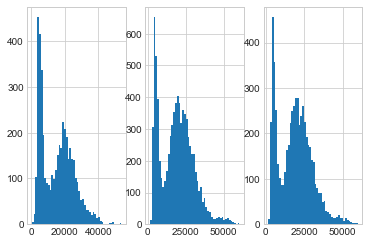

In [57]:
fig, [ax1,ax2, ax3] = plt.subplots(1,3)
ax1.hist(Fdf[~pd.isnull(Fdf).any(axis=1)].TotalCountLastWeek, 50)
ax2.hist(Fdf.TotalCount, 50)
ax3.hist(Fdf.loc[idxTrain].TotalCount,50)

print(len(Fdf), len(Fdf[~pd.isnull(Fdf).any(axis=1)]))
idxTrain

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: 'pandas.tools.plotting.scatter_matrix' is deprecated, import 'pandas.plotting.scatter_matrix' instead.
  after removing the cwd from sys.path.


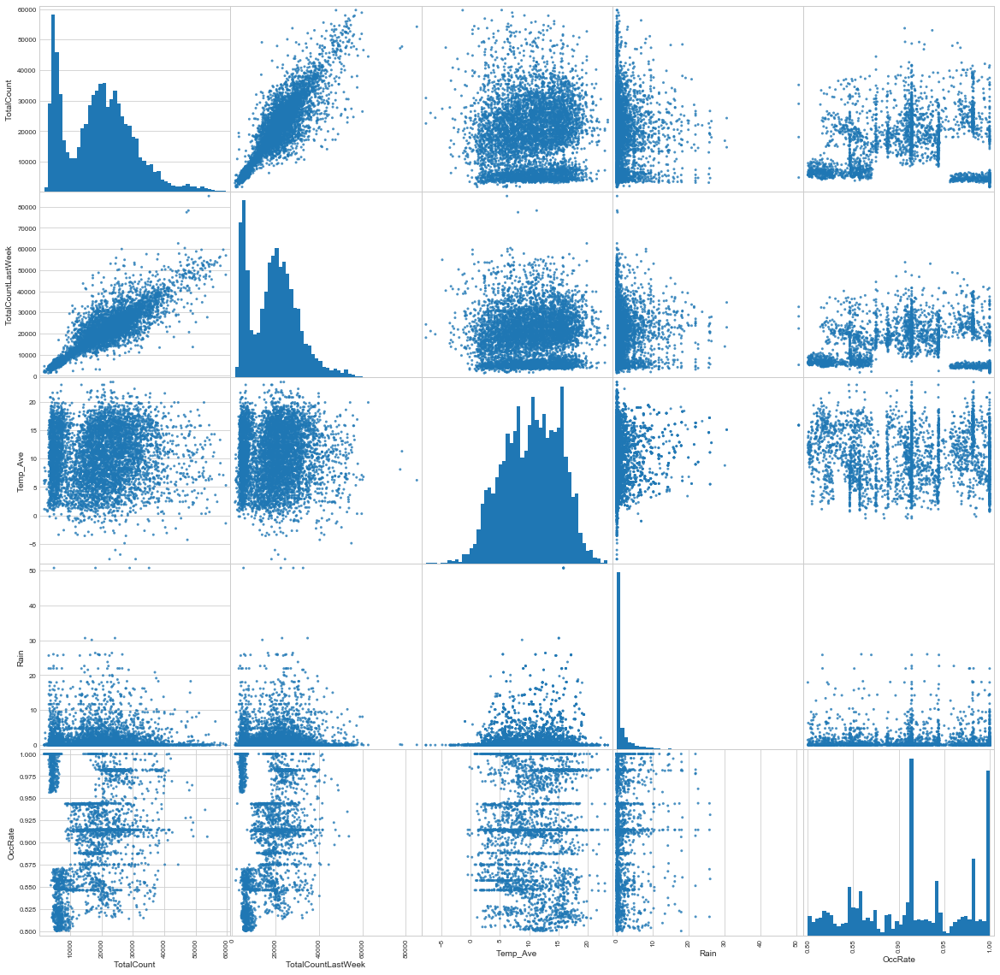

In [58]:
from pandas.tools.plotting import scatter_matrix
cols = [column for column in Fdf.columns if Fdf[column].dtype == 'float64']
colors = Fdf["LocationName"].map(lambda x: stColors.get(x))
s = scatter_matrix(Fdf.loc[idxTrain,cols], figsize=[20,20], alpha=0.8, hist_kwds={'bins':50})

In [59]:
# Create Parametrable Data transformations
# Remove outliers or not
# Add occupancy data or not
# Scale numerical attributes etc...

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Create a class to select numerical or categorical columns since Scikit-Learn doesn't handle DataFrames 
class DF2Array(BaseEstimator, TransformerMixin):
    def __init__(self, attributes):
        self.attributes = attributes
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        return X[self.attributes].values
    
class CustomScaler(BaseEstimator, TransformerMixin):
    def __init__(self, stype='Standard'): 
        self.stype  = stype
        return
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        if self.stype == 'Standard':
            scaler = StandardScaler()       
        elif self.stype == 'MinMax':
            scaler = MinMaxScaler()
        else:
            return X
        colstoscale = [3,5,6,7] # all numerical columns except Target column and occupancy (already in [0,1])
        X[:, colstoscale] = scaler.fit_transform(X[:, colstoscale].astype('float64'))
        return X

class SelectColumns(BaseEstimator, TransformerMixin):
    def __init__(self, colnumbers):
        self.colnumbers = colnumbers
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[:,self.colnumbers]    
    
class SelectWeekDay(BaseEstimator, TransformerMixin):
    def __init__(self, weekday = 'Alldays'): 
        self.weekday = weekday
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        if self.weekday != 'Alldays':
            wkdaylist = {'WeekDay_Friday' :9, 'WeekDay_Monday':10,'WeekDay_Saturday':11, 'WeekDay_Sunday':12, 'WeekDay_Thursday':13,'WeekDay_Tuesday':14, 'WeekDay_Wednesday':15}
            idxWeekDay = wkdaylist['WeekDay_' + self.weekday] # index for the WeekDay_xxxx column
            return np.delete(X[X[:, idxWeekDay] == 1], np.s_[9:16], 1)
        else:
            return X #np.delete(X, np.s_[9:16], 1)

class AddOccupancyData(BaseEstimator, TransformerMixin):
    def __init__(self, addoccupancy = True): 
        self.addoccupancy = addoccupancy
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        if self.addoccupancy:
            return X[~pd.isnull(X).any(axis=1)]  #Just drop the rows with NA values
        else:
            idxOccRate = 8 # index for the OccRate column
            return np.delete(X, idxOccRate, 1)   #Delete entire column     
  

class RemoveOutliers(BaseEstimator, TransformerMixin):
    def __init__(self, removeouts = True): 
        self.removeouts = removeouts
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        if self.removeouts:
            idxisOutlier = 4 # index for the isOutlier column
            return np.delete(X[X[:, idxisOutlier] == 0], idxisOutlier, 1)
        else:
            return np.delete(X, idxisOutlier, 1)    

class RemoveLastWeekCount(BaseEstimator, TransformerMixin):
    def __init__(self, removelwcounts = False): 
        self.removelwcounts = removelwcounts
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        if self.removelwcounts:
            idxTotalCountLastWeek = 3 # index for the TotalCountLastWeek column
            return np.delete(X, idxTotalCountLastWeek, 1) #Remove the entire column
        else:
            return X     #Do nothing   
    
class SelectStreet(BaseEstimator, TransformerMixin):
    def __init__(self, street = 'Coney Street'): 
        self.street = street
    def fit(self, X, y=None):
        return self  # nothing else to do
    def transform(self, X, y=None):
        idxLocation = 1 # index for the LocationName column
        return np.delete(X[X[:, idxLocation] == self.street], idxLocation, 1)

class RemoveDates(BaseEstimator, TransformerMixin):
    def __init__(self): 
        return
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        idxDate = 0 # index for the LocationName column
        return np.delete(X, idxDate, 1)
    
class UpdateColumnsList(BaseEstimator, TransformerMixin):
    def __init__(self): 
        return
    def fit(self, X, y=None):
        return self  # nothing to do
    def transform(self, X, y=None):
        trcolumns = get_columns(dataCleanPipe)
        return X   
    



In [60]:
# Aggregate all the transformations into one nice Pipeline

dataCleanPipe = Pipeline([
    ('data_sel', DF2Array(columnslist)),
    ('data_scale', CustomScaler('MinMax')),
    ('weekday_sel', SelectWeekDay()),
    ('occupancy_add', AddOccupancyData()),
    ('outliers_rem', RemoveOutliers()),
    ('lastweekc_rem', RemoveLastWeekCount()),
    ('street_sel', SelectStreet()),
    ('dates_rem', RemoveDates()),
    ])


def get_columns(pipe):
    c = columnslist.copy()
    c = c[0:9] if (pipe.get_params()['weekday_sel__weekday'] != 'Alldays') else c #Select and remove WeekDays
    c.pop(8) if not(pipe.get_params()['occupancy_add__addoccupancy']) else c #Select or remove OccRate
    c.pop(4) #remove isOutlier
    c.pop(3) if (pipe.get_params()['lastweekc_rem__removelwcounts']) else c #Select or remove LasWeekTotalCount
    c.pop(1) #remove LocationName
    c.pop(0) #remove Date
    return c
trcolumns = get_columns(dataCleanPipe)
#print(data_scale__stype) 
dataCleanPipe.set_params(weekday_sel__weekday='Saturday', street_sel__street='Stonegate', occupancy_add__addoccupancy = True)
x = dataCleanPipe.fit_transform(Traindf)

#print(get_columns(dataCleanPipe))
#np.set_printoptions(threshold=np.inf)
#y = np.delete(x[x[:, 3] == 0], 3, 1)
#p.set_printoptions(threshold=1000)

In [61]:
# Set up the training sets per street

def set_sets_per_street(pipe, datadf):
    X ,Y = {}, {}
    for i, s in enumerate(streets):
        pipe.set_params( street_sel__street=s, weekday_sel__weekday='Alldays',data_scale__stype='MinMax')
        X[i] = pipe.fit_transform((datadf))  #Create one training set per street
        Y[i] = X[i][:,0]                     #Separate target values
        X[i] = np.delete(X[i], 0, 1)
    return X, Y

X_train, Y_train = set_sets_per_street(dataCleanPipe, Traindf)
X_test, Y_test = set_sets_per_street(dataCleanPipe, Testdf)
X_total, Y_total= set_sets_per_street(dataCleanPipe, Fulldf)


In [62]:
#Train a defaultRandom Forest
from sklearn.ensemble import RandomForestRegressor
rf = {}

for i in range(len(streets)):
    rf[i] = RandomForestRegressor()
    rf[i].fit(X_train[i], Y_train[i])
    


In [63]:
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
wkdaycols = [5+sorted(weekdays).index(wkd) for wkd in weekdays]
X = X_train
Y = Y_train
j = 0 #Monday
i = 0 #Coney Street
wkdidx = wkdaycols[j]
[row for row in X[0] if row[wkdidx]==1]
indices =[r for r, row in enumerate(X[i]) if row[wkdidx]==1]
[row for r, row in enumerate(Y[i]) if r in indices]
rf

{0: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0, warm_start=False),
 1: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0, warm_start=False),
 2: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_sampl

In [64]:
['Accuracy', '+/- 1sd', 'RMSE', 'R2'] + ['R^2 '+wkd for wkd in weekdays] 

['Accuracy',
 '+/- 1sd',
 'RMSE',
 'R2',
 'R^2 Monday',
 'R^2 Tuesday',
 'R^2 Wednesday',
 'R^2 Thursday',
 'R^2 Friday',
 'R^2 Saturday',
 'R^2 Sunday']

Model Stats:  Standard Random Forest - no optimization


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.70,0.11,"1,176.01",0.97,0.94,0.94,0.88,0.96,0.89,0.95,0.84
Parliament Street,0.41,0.16,"1,907.81",0.91,0.88,0.87,0.90,0.90,0.79,0.86,0.83
Church Street,0.46,0.35,214.85,0.94,0.89,0.83,0.85,0.83,0.85,0.87,0.86
Micklegate,0.63,0.09,347.69,0.95,0.92,0.88,0.88,0.89,0.86,0.87,0.88
Stonegate,0.75,0.07,"1,019.80",0.97,0.94,0.94,0.93,0.91,0.82,0.93,0.90


,TotalCountLastWeek,DaysToXmas,Temp_Ave,Rain,OccRate,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Coney Street,0.04,0.23,0.03,0.04,0.05,0.02,0.00,0.58,0.00,0.00,0.00,0.00
Parliament Street,0.12,0.25,0.06,0.09,0.07,0.03,0.01,0.34,0.02,0.01,0.00,0.00
Church Street,0.30,0.09,0.07,0.05,0.03,0.08,0.00,0.34,0.02,0.01,0.00,0.01
Micklegate,0.44,0.08,0.05,0.05,0.04,0.03,0.00,0.30,0.00,0.00,0.00,0.00
Stonegate,0.14,0.16,0.03,0.03,0.04,0.01,0.00,0.59,0.00,0.00,0.00,0.00


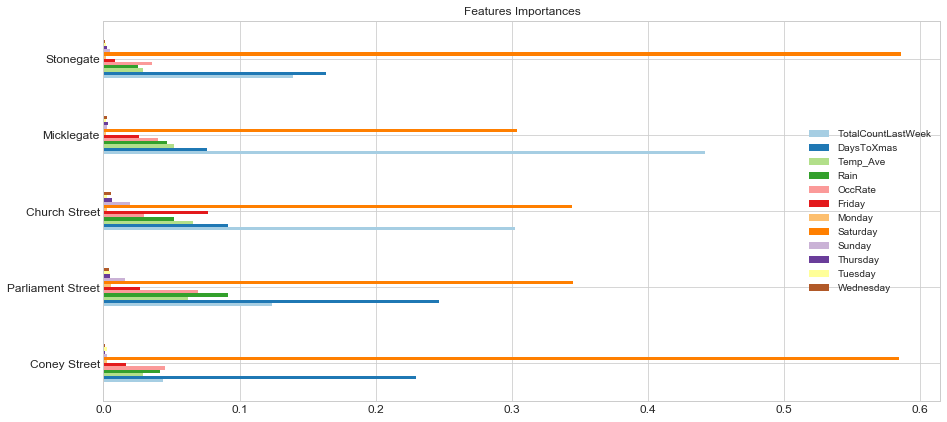

In [65]:
#Look at the fit: accuracy and RMSE
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

Y_pred = {}
Y_pred_test = {}

def display_estimators_stats(mdl,X ,Y, description, estimator=''):
    RMSE, R2 = {}, {}
    wkdaycols = [5+sorted(weekdays).index(wkd) for wkd in weekdays]
    curColList = get_columns(dataCleanPipe)
    nbfolds = 10
    stats = np.zeros((len(streets), 4 + 7))
    for i,s in enumerate(streets):
        smdl = mdl[i] if estimator=='' else mdl[i].best_estimator_
        scores = cross_val_score(smdl , X[i], Y[i], cv=nbfolds)
        Y_pred[i] = smdl.predict(X[i])
        RMSE[i] = np.sqrt(mean_squared_error(Y[i], Y_pred[i]))
        R2[i] = r2_score(Y[i], Y_pred[i])
        wkdaysR2 = [0,0,0,0,0,0,0]
        for j, wkd in enumerate(weekdays):
            indices =[r for r, row in enumerate(X[i]) if row[wkdaycols[j]]==1]  
            Ywkd = [row for r, row in enumerate(Y[i]) if r in indices]
            Ywkd_pred = [row for r, row in enumerate(Y_pred[i]) if r in indices]
            wkdaysR2[j] = r2_score(Ywkd,Ywkd_pred)
        stats[i] = np.concatenate(([scores.mean(), scores.std(), RMSE[i], R2[i]], wkdaysR2), axis=0) 
    cols = ['Accuracy', '+/- 1sd', 'RMSE', 'R2'] + ['R2 '+wkd for wkd in weekdays]  
    print("Model Stats: ", description)
    statsdf = pd.DataFrame(stats, index=streets, columns=cols)
    display(statsdf)
    return statsdf

def display_estimators_fimp(mdl,X ,Y, description, estimator=''):
    curColList = get_columns(dataCleanPipe)
    feats = np.zeros((len(streets), len(curColList[1:])))
    for i,s in enumerate(streets):
        smdl = mdl[i] if estimator=='' else mdl[i].best_estimator_
        Y_pred[i] = smdl.predict(X[i])
        feats[i] = smdl.feature_importances_
        #sorted(zip(mdl[i].feature_importances_, curColList[1:]), reverse=True):
    cols = [w.replace('WeekDay_', '') for w in curColList[1:]]
    featsdf = pd.DataFrame(feats, index=streets, columns=cols)
    featsdf.plot(kind='barh', title ="Features Importances",figsize=(15,7),
                 legend=True, fontsize=12, colormap='Paired')
    return featsdf

stdRfStats = pd.DataFrame()
stdRfFeats = pd.DataFrame()
stdRfStats = display_estimators_stats(rf, X_train, Y_train, "Standard Random Forest - no optimization")  
stdRfFeats = display_estimators_fimp(rf, X_train, Y_train, "Standard Random Forest - no optimization")  
stdRfFeats

In [66]:
[[3,1] for s in streets]

[[3, 1], [3, 1], [3, 1], [3, 1], [3, 1]]

In [67]:
[(x for x in [1,3]) for i, s in enumerate(streets)]


[<generator object <listcomp>.<genexpr> at 0x111996af0>,
 <generator object <listcomp>.<genexpr> at 0x111996728>,
 <generator object <listcomp>.<genexpr> at 0x111996258>,
 <generator object <listcomp>.<genexpr> at 0x111996308>,
 <generator object <listcomp>.<genexpr> at 0x1119964c0>]

In [68]:
max(3, 4)

4

Saving figure Results_test_rf


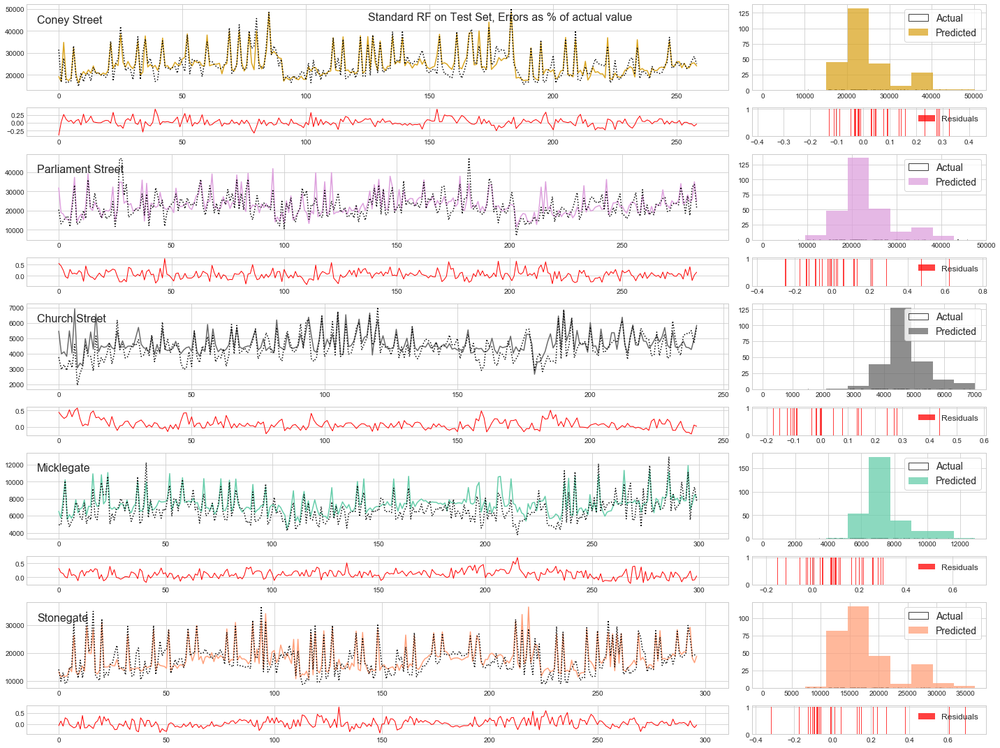

In [69]:
#Looks optically good
def plot_comp_res(mdl,X ,Y, description, estimator='' ):
    Y_pred = {}
    err={}
    fig, axes = plt.subplots(nrows=len(streets), ncols=2, figsize=(20,15), gridspec_kw = {'width_ratios':[3, 1]})
    plt.suptitle(description, fontsize=16)
    for i, s in enumerate(streets):
        smdl = mdl[i] if estimator=='' else mdl[i].best_estimator_
        Y_pred[i] = smdl.predict(X[i])
        axes[i][0].plot(Y[i],c=stColors.get(s))
        axes[i][0].plot(Y_pred[i], c='k', ls=':')
        ax = axes[i][0].twinx()
        #ax.set_ylabel('y2', color='r')
        axes[i][1].hist(Y[i], facecolor= 'None',edgecolor='k', alpha=0.75, label='Actual')
        axes[i][1].hist(Y_pred[i], facecolor=stColors.get(s), alpha=0.75, label='Predicted')
        axes[i][1].legend(frameon=True, loc="upper right", fontsize=14)
    return Y_pred


def plot_comp_res_with_errors(mdl,X ,Y, description, estimator='' ):
    Y_pred = {}
    err={}
    fig, axes = plt.subplots(nrows=2*len(streets), ncols=2, figsize=(20,15), 
                             gridspec_kw = {'width_ratios':[3,1], 'height_ratios':[3,1,3,1,3,1,3,1,3,1]})
    plt.suptitle(description, fontsize=16)
    for i, s in enumerate(streets):
        smdl = mdl[i] if estimator=='' else mdl[i].best_estimator_
        Y_pred[i] = smdl.predict(X[i])
        err[i] = np.divide((Y_pred[i] - Y[i]), Y[i])
        #err[i] = (Y_pred[i] - Y[i])
        axes[2*i][0].plot(Y_pred[i],c=stColors.get(s), label=s)
        axes[2*i][0].plot(Y[i], c='k', ls=':')
        axes[2*i+1][0].plot(err[i], 'r-', linewidth=1)
        leg = axes[2*i][0].legend(frameon=False, loc="upper left", fontsize=16,
                                  handlelength=0, handletextpad=0, fancybox=True)
        for item in leg.legendHandles:
            item.set_visible(False)
        #ax.set_ylabel('y2', color='r')
        bins = np.linspace(0, max(max(Y[i]), max(Y_pred[i])),11)
        axes[2*i][1].hist(Y[i], bins=bins, facecolor= 'None',edgecolor='k', alpha=0.75, label='Actual')
        axes[2*i][1].hist(Y_pred[i], bins=bins, facecolor=stColors.get(s), alpha=0.75, label='Predicted')
        axes[2*i][1].legend(frameon=True, loc="upper right", fontsize=14)
        axes[2*i+1][1].hist(err[i], facecolor='r', alpha=0.75, label = 'Residuals')
        axes[2*i+1][1].legend(frameon=False, loc="upper right", fontsize=12)
    return Y_pred, err

Y_test_pred, err_test = plot_comp_res_with_errors(rf, X_test, Y_test, "Standard RF on Test Set, Errors as % of actual value")

save_fig('Results_test_rf', tight_layout=True, fig_extension="png", resolution=300)


Saving figure Results_train_rf


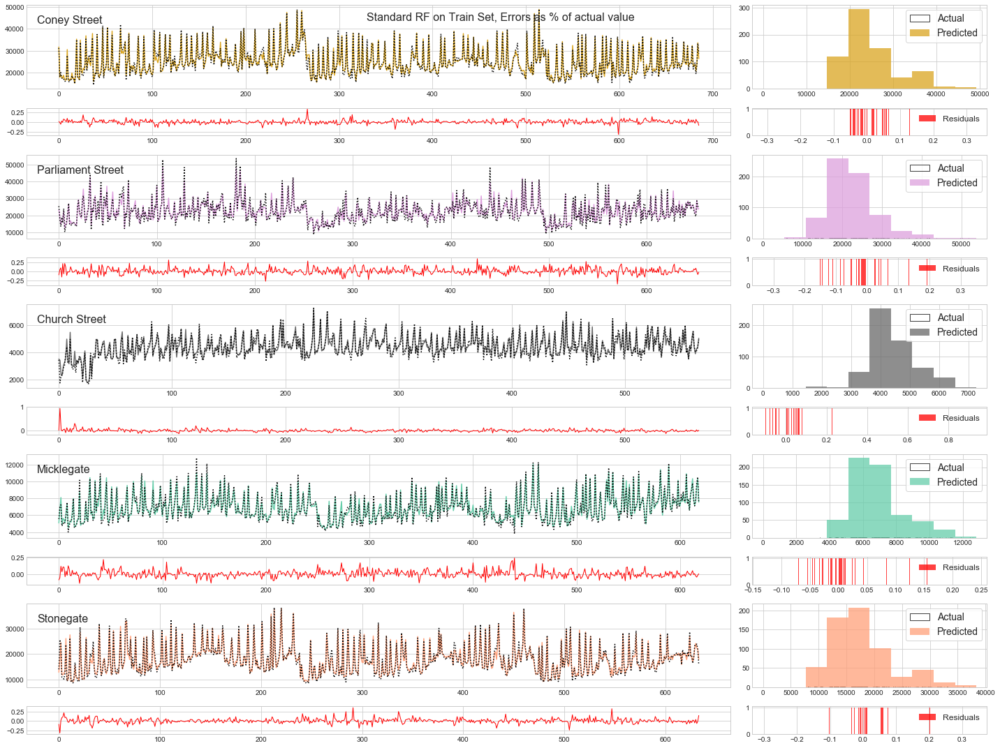

In [70]:
Y_train_pred, err_train = plot_comp_res_with_errors(rf, X_train, Y_train, "Standard RF on Train Set, Errors as % of actual value")

save_fig('Results_train_rf', tight_layout=True, fig_extension="png", resolution=300)


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = {}

for i in range(len(streets)):
    gbr[i] = GradientBoostingRegressor(max_depth=10, n_estimators = 50, learning_rate =0.1)
    gbr[i].fit(X_train[i], Y_train[i])



In [ ]:
stdRfStats = display_estimators_stats(gbr, X_train, Y_train, "GradientBoostingRegressor") 

In [61]:
 stdRfStats = display_estimators_stats(gbr, X_test, Y_test, "GradientBoostingRegressor") 


Model Stats:  GradientBoostingRegressor


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.67,0.07,"2,644.35",0.82,0.54,0.62,0.49,0.73,-0.07,0.62,0.60
Parliament Street,0.01,0.58,"4,617.06",0.51,0.42,0.52,0.40,0.34,-0.64,0.15,0.44
Church Street,0.31,0.34,509.57,0.62,0.03,0.37,-0.20,-0.19,0.36,0.18,0.34
Micklegate,0.36,0.30,796.74,0.73,0.46,0.40,0.61,0.25,0.35,0.26,0.35
Stonegate,0.63,0.17,"2,497.89",0.80,0.61,0.53,0.70,0.58,0.16,-0.25,0.34


Saving figure Results_train_gbr


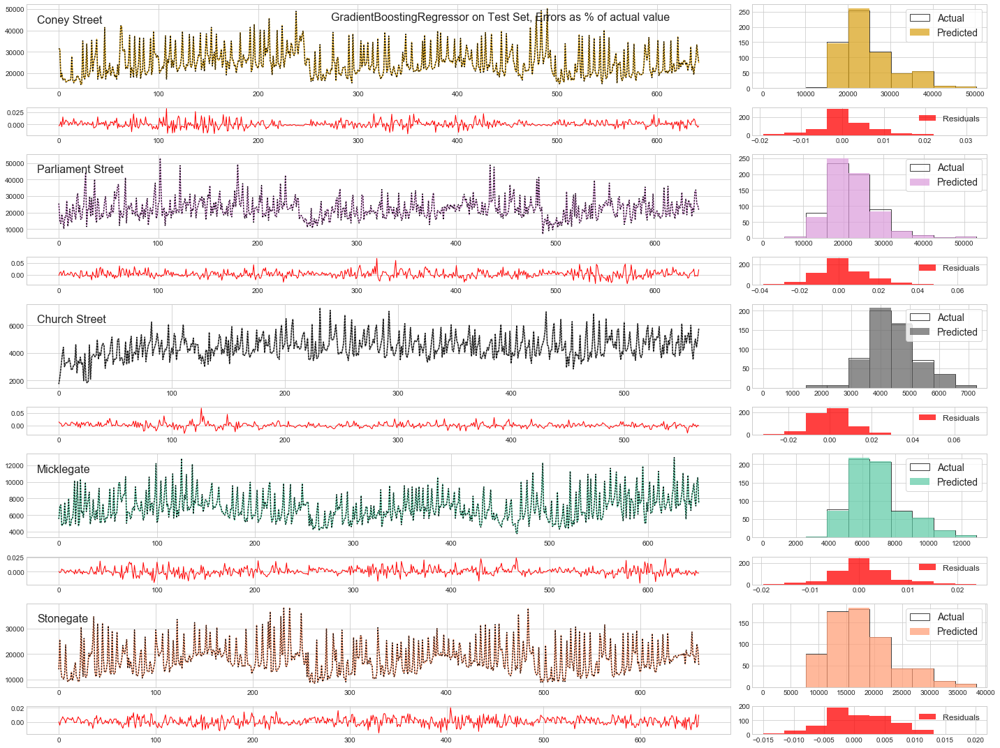

In [64]:
#Y_train_pred, err_train = plot_comp_res_with_errors(rf, X_train, Y_train, "Standard RF on Train Set, Errors as % of actual value")
Y_train_pred, err_train = plot_comp_res_with_errors(gbr, X_train, Y_train, "GradientBoostingRegressor on Test Set, Errors as % of actual value")
save_fig('Results_train_gbr', tight_layout=True, fig_extension="png", resolution=300)


Saving figure Results_test_gbr


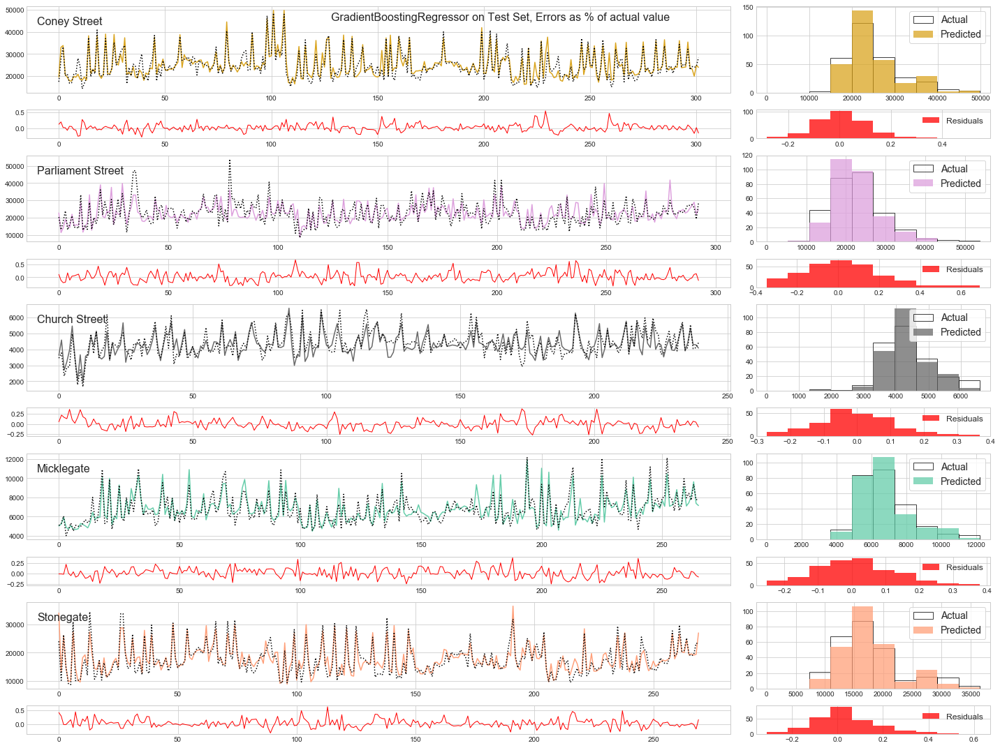

In [65]:
#Y_train_pred, err_train = plot_comp_res_with_errors(rf, X_train, Y_train, "Standard RF on Train Set, Errors as % of actual value")
Y_test_pred, err_test = plot_comp_res_with_errors(gbr, X_test, Y_test, "GradientBoostingRegressor on Test Set, Errors as % of actual value")
save_fig('Results_test_gbr', tight_layout=True, fig_extension="png", resolution=300)


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Saving figure qqplots_gbr


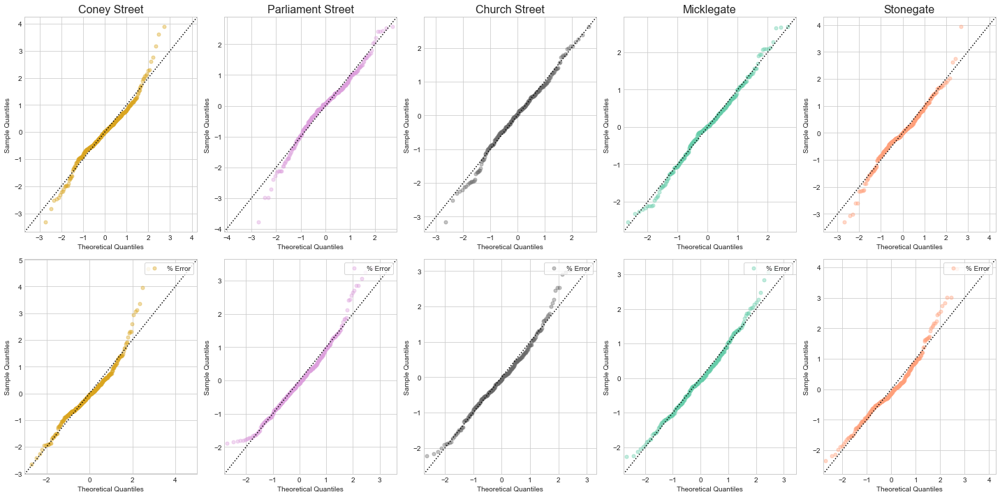

In [66]:
import statsmodels.api as sm
import scipy.stats as stats

def plot_qqplots(Y, err):
    fig, axes = plt.subplots(nrows=2, ncols=len(streets), figsize=(20, 10))
    for i,s in enumerate(streets):
        axes[0][i].set_title(s, fontsize=16)
        #axes[0][i].xlabel(fontsize=14)
        pp = sm.ProbPlot(np.multiply(err[i], Y[i]), fit=True)
        qq = pp.qqplot(marker='o', markerfacecolor=stColors.get(s), markeredgecolor=stColors.get(s), 
                       markersize=5, alpha=0.4, ax = axes[0][i], label="Net error")
        sm.qqline(axes[0][i], line='45', fmt='k:')
        pp = sm.ProbPlot(err[i], fit=True)
        qq = pp.qqplot(marker='o', markerfacecolor=stColors.get(s), markeredgecolor=stColors.get(s), 
                       markersize=5, alpha=0.4, ax = axes[1][i], label="% Error")
        sm.qqline(axes[1][i], line='45', fmt='k:')
        axes[1][i].legend(frameon=True, loc="upper right")
        #q = sm.qqplot(err_train[i], stats.norm,  fit=True, line ='45', ax = axes[0][i])
    return
                  
plot_qqplots(Y_test, err_test)
save_fig('qqplots_gbr', tight_layout=True, fig_extension="png", resolution=300)

In [67]:
#Fine tuning the model to find the best parameters
#By running a Grid Search
from sklearn.model_selection import GridSearchCV
import time
start_time = time.time()

scoreFunc = 'r2'
#scoreFunc = 'neg_mean_squared_error'

param_grid = [
    # try 25 (5×5) combinations of hyperparameters
    {'n_estimators': [3, 10, 30, 50, 100], 'max_features': [2, 4, 6, 8, 12]},
    # then try 9 (3×3) combinations with bootstrap set as False
    {'bootstrap': [False], 'n_estimators': [3, 10, 50], 'max_features': [2, 3, 4]},
  ]

print("---Executing Grid Search.....")

grids = {}
for i in range(len(streets)):
    #rf[i] = RandomForestRegressor()
    # train across 5 folds, that's a total of (20+9)*5=155 rounds of training for each street
    grids[i] = GridSearchCV(RandomForestRegressor(), param_grid, cv=5,scoring=scoreFunc)
    grids[i].fit(X_train[i], Y_train[i])

print("---Grid Search Completed - Execution Time: %s seconds ---" % (time.time() - start_time))

---Executing Grid Search.....
---Grid Search Completed - Execution Time: 58.821264028549194 seconds ---


In [68]:
for i,s  in enumerate(streets):
    print(s, grids[i].best_params_)

Coney Street {'max_features': 12, 'n_estimators': 100}
Parliament Street {'max_features': 4, 'n_estimators': 100}
Church Street {'max_features': 12, 'n_estimators': 100}
Micklegate {'max_features': 4, 'n_estimators': 100}
Stonegate {'max_features': 6, 'n_estimators': 100}


In [69]:
for i,s  in enumerate(streets):
    print(s, grids[i].best_estimator_)

Coney Street RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=12, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)
Parliament Street RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=4, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)
Church Street RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=12, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_l

In [70]:
stdGridStats = display_estimators_stats(grids, X_train, Y_train, "Best Random Forest - GridSearch", 'best_estimator_')

Model Stats:  Best Random Forest - GridSearch


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.73,0.10,989.94,0.98,0.95,0.95,0.95,0.95,0.92,0.94,0.92
Parliament Street,0.51,0.12,"1,582.58",0.94,0.92,0.90,0.91,0.89,0.90,0.87,0.90
Church Street,0.53,0.22,175.52,0.96,0.92,0.89,0.91,0.89,0.89,0.91,0.93
Micklegate,0.64,0.14,286.71,0.97,0.93,0.93,0.92,0.93,0.92,0.91,0.89
Stonegate,0.77,0.06,918.59,0.98,0.93,0.95,0.96,0.96,0.86,0.93,0.91


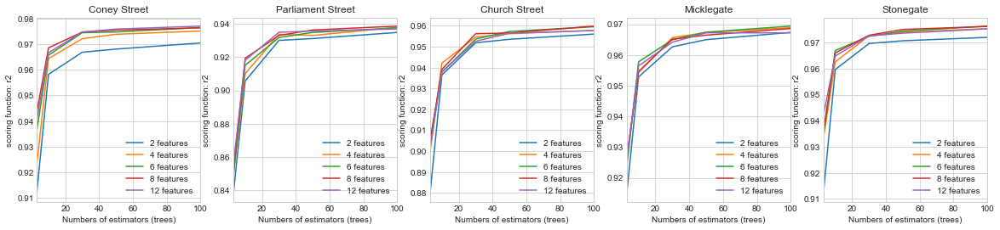

In [71]:

fig, axes = plt.subplots(nrows = 1, ncols=len(streets), figsize = (20,4))
for i,s in enumerate(streets):
    gridres =pd.DataFrame(grids[i].cv_results_)
    gridres = gridres[(gridres['param_bootstrap'] != False)][['param_n_estimators', 'param_max_features', 'mean_train_score']]
    for f in param_grid[0]['max_features']:
        gridres[gridres['param_max_features'] == f].plot(ax=axes[i],x='param_n_estimators', y='mean_train_score', label = str(f)+' features')
        axes[i].set_xlabel("Numbers of estimators (trees)")
        axes[i].set_ylabel("scoring function: " + scoreFunc)
        axes[i].set_title(s)
        
# So performace plateaus above 40 trees
# but we need at least 8 features


Saving figure Results_test_grid


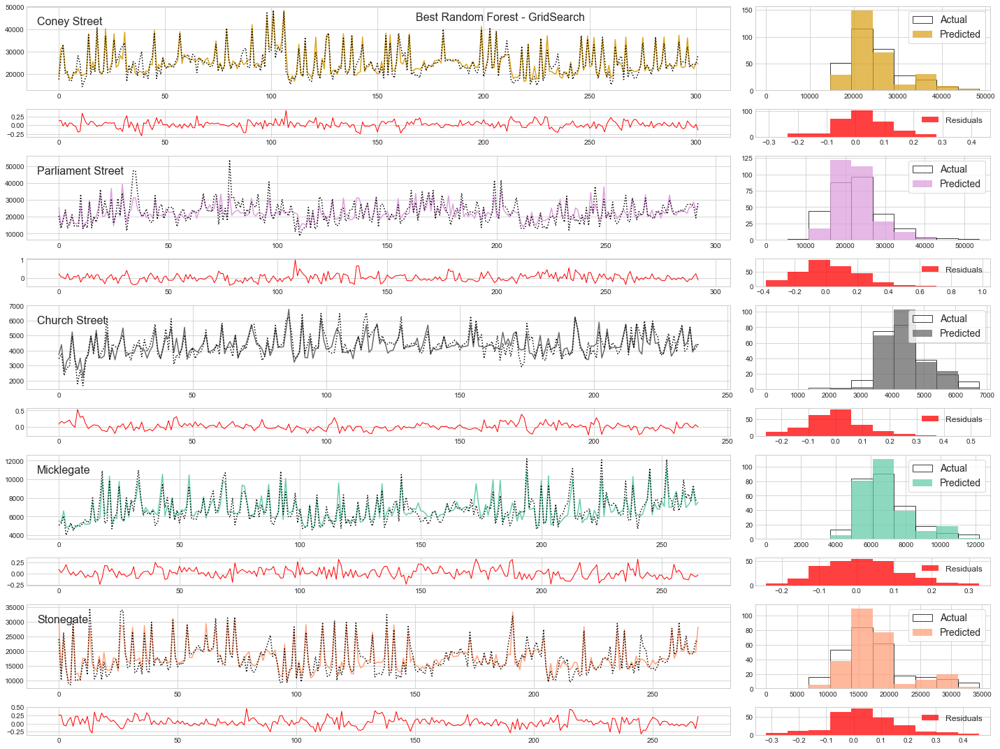

In [72]:
Y_test_pred, err_test = plot_comp_res_with_errors(grids, X_test, Y_test, 
                                                  "Best Random Forest - GridSearch", 'best_estimator_')

save_fig('Results_test_grid', tight_layout=True, fig_extension="png", resolution=300)

In [73]:
#Try Randomized Search this time with bootstrapping always
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

start_time = time.time()

param_ranges = {
        'n_estimators': randint(low=1, high=200),
        'max_features': randint(low=1, high=12),
    }

print("---Executing Random Search.....")

rnds = {}
for i in range(len(streets)):
    #rf[i] = RandomForestRegressor()
    rnds[i] = RandomizedSearchCV(RandomForestRegressor(), param_ranges, n_iter=10, cv=5, scoring=scoreFunc)
    rnds[i].fit(X_train[i], Y_train[i])

print("Randomized Search Execution Time: %s seconds ---" % (time.time() - start_time))

---Executing Random Search.....
Randomized Search Execution Time: 45.872133016586304 seconds ---


In [74]:
for i,s  in enumerate(streets):
    print(s, rnds[i].best_params_)

Coney Street {'max_features': 9, 'n_estimators': 143}
Parliament Street {'max_features': 9, 'n_estimators': 121}
Church Street {'max_features': 7, 'n_estimators': 57}
Micklegate {'max_features': 3, 'n_estimators': 134}
Stonegate {'max_features': 7, 'n_estimators': 64}


Model Stats:  Best Random Forest - RandomSearch


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.73,0.08,977.99,0.98,0.95,0.95,0.96,0.95,0.91,0.94,0.92
Parliament Street,0.51,0.13,"1,551.66",0.94,0.92,0.91,0.92,0.90,0.89,0.88,0.89
Church Street,0.54,0.24,177.62,0.96,0.90,0.88,0.90,0.88,0.92,0.90,0.92
Micklegate,0.64,0.13,287.57,0.97,0.93,0.93,0.92,0.93,0.91,0.91,0.90
Stonegate,0.77,0.07,905.21,0.98,0.94,0.95,0.96,0.96,0.88,0.92,0.91


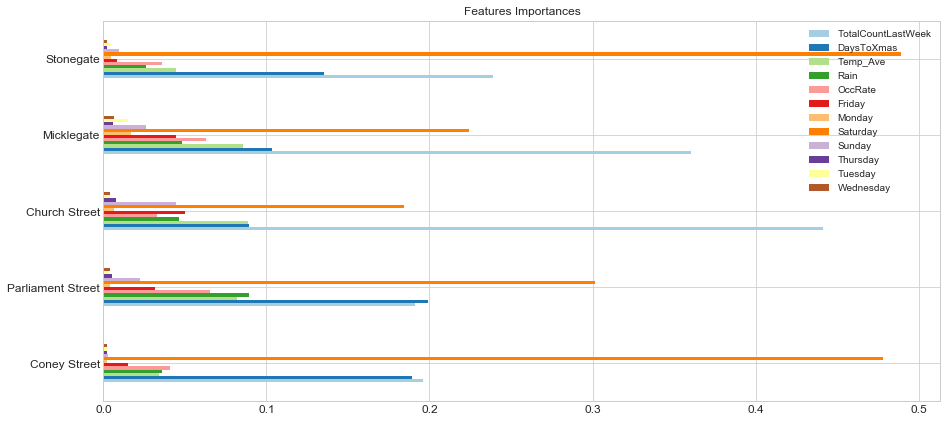

In [75]:
stdRndStats = display_estimators_stats(rnds, X_train, Y_train, "Best Random Forest - RandomSearch", 'best_estimator')

stdRndFeats = display_estimators_fimp(rnds, X_train, Y_train, "Best Random Forest - RandomSearch", 'best_estimator')  


Saving figure Results_train_rnds


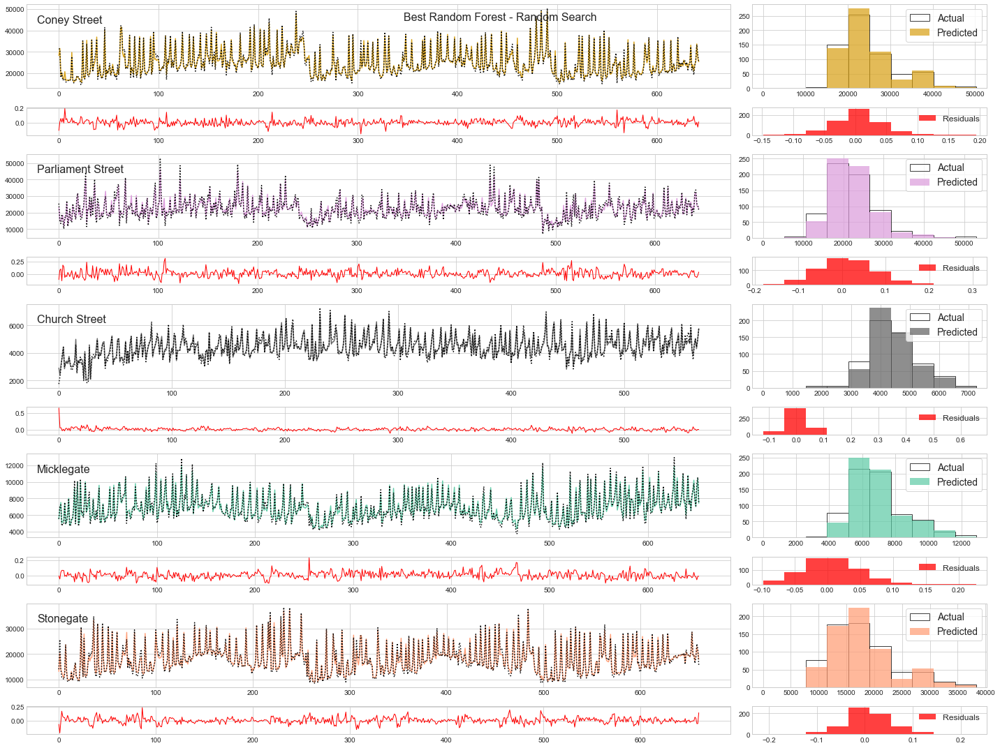

In [76]:
Y_train_pred, err_train = plot_comp_res_with_errors(rnds, X_train, Y_train, 
                                                  "Best Random Forest - Random Search", 'best_estimator_')

save_fig('Results_train_rnds', tight_layout=True, fig_extension="png", resolution=300)

Saving figure Results_test_rnds


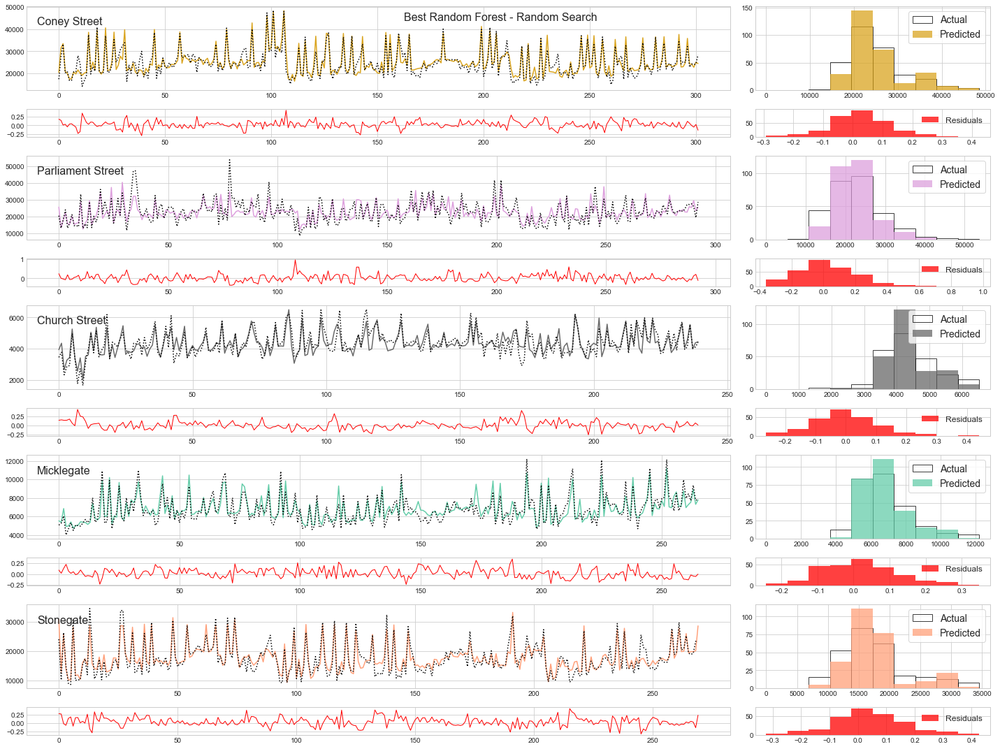

In [77]:
Y_test_pred, err_test = plot_comp_res_with_errors(rnds, X_test, Y_test, 
                                                  "Best Random Forest - Random Search", 'best_estimator_')

save_fig('Results_test_rnds', tight_layout=True, fig_extension="png", resolution=300)

In [78]:
#Lets look at performance over the test set
    
srf = display_estimators_stats(rf, X_test, Y_test, "Standard Random Forest - No optimization")
srd = display_estimators_stats(rnds, X_test, Y_test, "Best Random Forest - RandomSearch", 'best_estimator')
sbt = display_estimators_stats(gbr, X_test, Y_test, "Boosted Trees - No-optimisation")

Model Stats:  Standard Random Forest - No optimization


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.70,0.08,"2,551.39",0.83,0.54,0.52,0.36,0.67,0.49,0.64,0.51
Parliament Street,0.33,0.23,"4,430.28",0.55,0.38,0.63,0.42,0.36,-0.14,0.17,0.39
Church Street,0.39,0.24,498.66,0.64,0.07,0.36,-0.19,0.08,0.32,0.27,0.29
Micklegate,0.57,0.20,812.80,0.71,0.36,0.42,0.55,0.24,0.28,0.26,0.41
Stonegate,0.64,0.20,"2,353.06",0.82,0.55,0.31,0.69,0.56,0.47,0.06,0.50


Model Stats:  Best Random Forest - RandomSearch


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.74,0.05,"2,513.02",0.84,0.49,0.61,0.46,0.68,0.45,0.62,0.54
Parliament Street,0.43,0.20,"4,355.28",0.56,0.44,0.62,0.47,0.38,-0.00,0.19,0.32
Church Street,0.45,0.22,465.60,0.68,0.23,0.40,-0.08,0.11,0.35,0.45,0.42
Micklegate,0.60,0.20,725.98,0.77,0.51,0.48,0.61,0.40,0.39,0.48,0.47
Stonegate,0.67,0.18,"2,270.67",0.83,0.56,0.51,0.74,0.59,0.46,0.14,0.39


Model Stats:  Boosted Trees - No-optimisation


,Accuracy,+/- 1sd,RMSE,R2,R2 Monday,R2 Tuesday,R2 Wednesday,R2 Thursday,R2 Friday,R2 Saturday,R2 Sunday
Coney Street,0.67,0.07,"2,644.35",0.82,0.54,0.62,0.49,0.73,-0.07,0.62,0.60
Parliament Street,-0.01,0.59,"4,617.06",0.51,0.42,0.52,0.40,0.34,-0.64,0.15,0.44
Church Street,0.30,0.34,509.57,0.62,0.03,0.37,-0.20,-0.19,0.36,0.18,0.34
Micklegate,0.38,0.29,796.74,0.73,0.46,0.40,0.61,0.25,0.35,0.26,0.35
Stonegate,0.63,0.17,"2,497.89",0.80,0.61,0.53,0.70,0.58,0.16,-0.25,0.34


In [79]:
srf.Accuracy[s]

0.63693569624723811

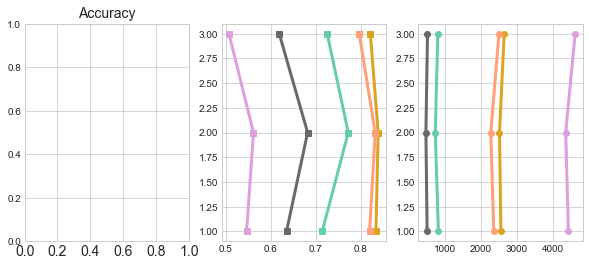

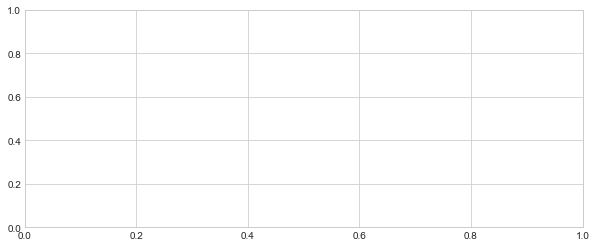

In [80]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,4)) #gridspec_kw = {'width_ratios':[3,3,3], 'height_ratios':[1,1]})
fig, ax =plt.subplots(nrows=1, ncols=1, figsize=(10,4))
for i, s in enumerate(streets):
    axes[0].set_yticks = [1,2,3]
    axes[0].set_ytickslabels = ["Default \n Forest","Optimzed \n Trees","Boosted \n Trees"]
    #axes[0].xaxis.tick_top()
    plt.setp(axes[0].get_xticklabels(), fontsize=14)
    axes[0].set_title("Accuracy", fontsize=14)
    axes[1].plot([srf.R2[s], srd.R2[s],sbt.R2[s]],[1,2,3], c=stColors.get(s), marker='s', linewidth=3)
    axes[2].plot([srf.RMSE[s], srd.RMSE[s],sbt.RMSE[s]],[1,2,3], c=stColors.get(s), marker='o', linewidth=3)
    
    

Saving figure qqplots_rnds


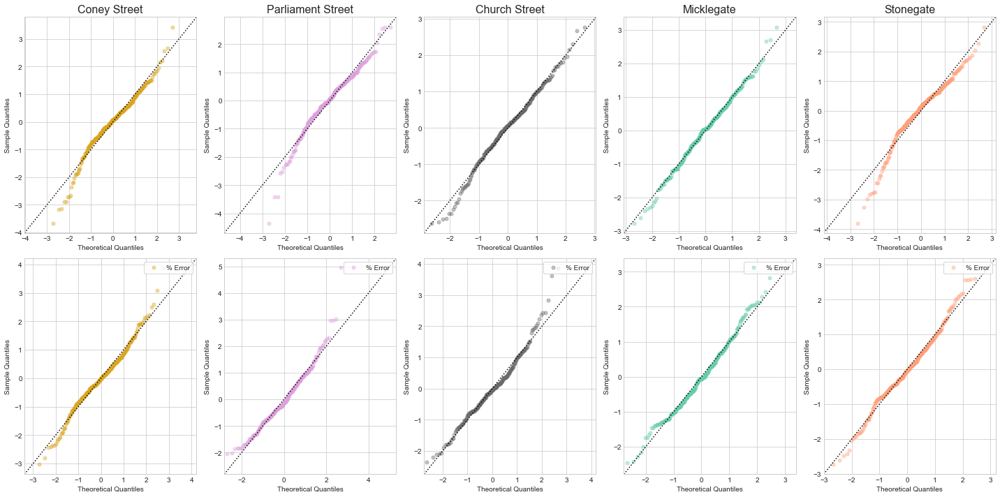

In [81]:
plot_qqplots(Y_test, err_test)
save_fig('qqplots_rnds', tight_layout=True, fig_extension="png", resolution=300)

In [82]:
#Let's look at linear regression models 


def create_daily_sets_per_street(pipe, datadf):
    X, Y = {}, {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):
            dataCleanPipe.set_params(street_sel__street=s, weekday_sel__weekday=d)
            X[i,j] = pipe.fit_transform(datadf)  #Create one training set per street, per day
            Y[i,j] = X[i,j][:,0]                     #Separate target values
            X[i,j] = np.delete(X[i,j], 0, 1)
    return X,Y

dataCleanPipe.set_params(data_scale__stype='MinMax')
X_train_d, Y_train_d = create_daily_sets_per_street(dataCleanPipe, Traindf)
X_test_d, Y_test_d = create_daily_sets_per_street(dataCleanPipe, Testdf)



In [83]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge

LM = {'OLS': LinearRegression(),
     'Ridge': Ridge(), #alpha=0.5
     'Lasso': Lasso()  #alpha = 0.1
     } 
     

def fit_estimator(model):
    lr = {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):  
            lr[i,j] = model
            lr[i,j].fit(X_train_d[i,j], Y_train_d[i,j])
            print(lr[i,j].coef_)
    return lr



In [84]:
ll = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        ll[i,j] = LinearRegression()
        ll[i,j].fit(X_train_d[i,j], Y_train_d[i,j])
          
lr = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        lr[i,j] = Ridge()
        lr[i,j].fit(X_train_d[i,j], Y_train_d[i,j])
        
la = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        la[i,j] = Lasso()
        la[i,j].fit(X_train_d[i,j], Y_train_d[i,j])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/linalg/basic.py:1018: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


In [85]:
#ll = fit_estimator(LinearRegression())       #linear regression
#lr = fit_estimator(LM['Ridge'])     #ridge regression
#la = fit_estimator(LM['Lasso'])     #lasso regression


In [106]:
def concatdays(s, wkdata):
    data = wkdata[s,0]
    for j, d in enumerate(weekdays): 
        data = data if j==0 else np.concatenate((data, wkdata[s,j]))
    return data

#np.concatenate((Y_train_d[0,0], Y_train_d[0,1]))


['Alldays',
 'Monday',
 'Tuesday',
 'Wednesday',
 'Thursday',
 'Friday',
 'Saturday',
 'Sunday']

In [137]:
def concatdays(s, wkdata):
    data = wkdata[s,0]
    for j, d in enumerate(weekdays): 
        data = data if j==0 else np.concatenate((data, wkdata[s,j]))
    return data
        
    #stats[i] = np.concatenate(([scores.mean(), scores.std(), RMSE[i], R2[i]], wkdaysR2), axis=0) 
    #cols = ['Accuracy', '+/- 1sd', 'RMSE', 'R2'] + ['R2 '+wkd for wkd in weekdays]  
    #print("Model Stats: ", description)
    #statsdf = pd.DataFrame(stats, index=streets, columns=cols)
      
    
        
def display_LR_stats_total(est, X, Y):
    sRMSE = np.zeros((len(streets), len(weekdays)))
    sRMSEtot = np.zeros(len(streets))
    sR2 =  np.zeros((len(streets), len(weekdays)))
    sR2tot = np.zeros(len(streets))
    Y_pred = {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):  
            Y_pred[i,j] = est[i,j].predict(X[i,j])
            sRMSE[i,j] = np.sqrt(mean_squared_error(Y[i,j], Y_pred[i,j]))            
            sR2[i,j] = r2_score(Y[i,j], Y_pred[i,j])
        sRMSEtot[i] = np.sqrt(mean_squared_error(concatdays(i,Y), concatdays(i,Y_pred)))
        sR2tot[i] = r2_score(concatdays(i,Y), concatdays(i,Y_pred))
    df1 = pd.DataFrame(np.c_[sRMSEtot ,sRMSE], index=streets, columns=(['Alldays'] + weekdays))
    df2 = pd.DataFrame(np.c_[sR2tot,sR2], index=streets, columns=(['Alldays'] + weekdays))
    display(est[0,0], "RMSE", df1, "R2",df2)
    
    
def display_LR_stats(est, X, Y):
    sRMSE = np.zeros((len(streets), len(weekdays)))
    sR2 =  np.zeros((len(streets), len(weekdays)))
    Y_pred = {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):  
            Y_pred[i,j] = est[i,j].predict(X[i,j])
            sRMSE[i,j] = np.sqrt(mean_squared_error(Y[i,j], Y_pred[i,j]))            
            sR2[i,j] = r2_score(Y[i,j], Y_pred[i,j])
    df1 = pd.DataFrame(sRMSE, index=streets, columns=weekdays)
    df2 = pd.DataFrame(sR2, index=streets, columns=weekdays)
    display(est[0,0], "RMSE", df1, "R2",df2)

In [138]:
display_LR_stats_total(ll, X_train_d, Y_train_d)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

'RMSE'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"2,977.57","2,988.72","3,027.41","2,887.54","3,127.23","3,178.20","2,560.79","3,030.66"
Parliament Street,"4,136.29","3,377.92","3,581.56","3,769.73","3,647.15","4,176.59","6,013.29","3,948.43"
Church Street,472.25,383.70,389.11,430.53,513.09,515.99,491.13,539.75
Micklegate,789.64,768.36,666.24,797.42,735.66,697.18,"1,021.81",776.32
Stonegate,"2,549.34","2,981.89","2,403.51","2,381.53","2,404.07","2,754.69","2,326.23","2,527.89"


'R2'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.79,0.39,0.44,0.47,0.44,0.38,0.62,0.46
Parliament Street,0.57,0.30,0.20,0.27,0.28,0.25,0.27,0.31
Church Street,0.70,0.26,0.21,0.28,0.21,0.32,0.41,0.45
Micklegate,0.76,0.46,0.37,0.30,0.41,0.49,0.38,0.25
Stonegate,0.81,0.38,0.55,0.54,0.54,0.33,0.57,0.29


In [139]:
display_LR_stats_total(lr, X_train_d, Y_train_d)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

'RMSE'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"3,153.60","3,048.53","3,179.28","3,029.01","3,228.07","3,332.01","3,181.55","3,074.52"
Parliament Street,"4,283.62","3,479.04","3,687.45","3,852.65","3,746.51","4,571.56","6,210.39","3,976.84"
Church Street,551.36,434.25,422.09,487.28,555.22,581.22,608.55,693.32
Micklegate,899.73,895.37,729.31,868.08,824.91,835.66,"1,228.20",810.95
Stonegate,"2,712.52","3,041.67","2,632.69","2,530.19","2,552.35","2,898.19","2,745.88","2,544.14"


'R2'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.77,0.37,0.39,0.42,0.40,0.32,0.41,0.44
Parliament Street,0.54,0.26,0.15,0.23,0.24,0.10,0.22,0.30
Church Street,0.59,0.05,0.07,0.08,0.08,0.13,0.09,0.10
Micklegate,0.69,0.26,0.25,0.17,0.25,0.26,0.10,0.19
Stonegate,0.78,0.36,0.46,0.48,0.48,0.25,0.40,0.28


In [140]:
display_LR_stats_total(la, X_train_d, Y_train_d)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

'RMSE'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"2,977.76","2,988.95","3,027.56","2,887.67","3,127.44","3,178.37","2,561.04","3,030.87"
Parliament Street,"4,137.47","3,379.28","3,583.39","3,770.97","3,648.36","4,177.77","6,014.06","3,949.56"
Church Street,491.59,412.53,409.16,457.80,531.51,533.36,507.24,552.79
Micklegate,794.93,774.25,677.25,802.66,742.08,702.53,"1,024.06",779.86
Stonegate,"2,549.66","2,982.11","2,403.78","2,381.87","2,404.43","2,754.93","2,326.68","2,528.33"


'R2'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.79,0.39,0.44,0.47,0.44,0.38,0.62,0.46
Parliament Street,0.57,0.30,0.20,0.27,0.28,0.25,0.27,0.31
Church Street,0.67,0.14,0.13,0.19,0.16,0.27,0.37,0.43
Micklegate,0.76,0.45,0.35,0.29,0.40,0.48,0.37,0.25
Stonegate,0.81,0.38,0.55,0.54,0.54,0.33,0.57,0.29


In [141]:
#let's look at ll over the test set
display_LR_stats_total(ll, X_test_d, Y_test_d)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

'RMSE'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"3,060.75","3,418.82","2,695.50","3,117.64","2,806.95","2,792.32","3,389.20","3,103.62"
Parliament Street,"4,713.26","3,256.42","3,879.32","4,050.28","4,786.66","4,248.89","6,827.55","4,578.34"
Church Street,706.82,473.23,388.11,611.21,475.18,551.20,496.14,"1,399.62"
Micklegate,784.72,723.53,567.61,662.23,724.86,"1,046.26",946.26,840.84
Stonegate,"2,881.70","3,263.07","3,011.99","2,810.92","2,777.83","2,516.65","3,434.62","2,283.37"


'R2'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.76,0.15,0.31,0.34,0.38,0.38,0.38,0.36
Parliament Street,0.49,0.28,0.23,0.28,0.17,0.10,0.12,0.26
Church Street,0.27,0.13,0.38,-0.41,0.09,0.19,0.35,-3.92
Micklegate,0.73,0.37,0.42,0.45,0.33,0.11,0.55,0.40
Stonegate,0.73,0.28,-0.04,0.35,0.15,0.44,-0.27,0.30


In [142]:
#let's look at la over the test set
display_LR_stats_total(la, X_test_d, Y_test_d)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

'RMSE'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"3,059.92","3,431.23","2,688.72","3,115.85","2,809.53","2,792.62","3,381.76","3,096.61"
Parliament Street,"4,702.53","3,235.98","3,811.24","4,066.21","4,781.05","4,222.04","6,837.07","4,572.67"
Church Street,639.04,510.35,428.35,582.96,487.87,580.80,500.31,"1,114.65"
Micklegate,796.21,722.54,579.69,660.58,729.01,"1,068.35",972.01,858.93
Stonegate,"2,868.83","3,259.54","2,996.81","2,798.53","2,760.26","2,514.16","3,405.42","2,274.60"


'R2'

,Alldays,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.76,0.14,0.31,0.34,0.38,0.38,0.38,0.36
Parliament Street,0.49,0.29,0.25,0.28,0.18,0.11,0.12,0.26
Church Street,0.40,-0.01,0.24,-0.28,0.04,0.10,0.34,-2.12
Micklegate,0.73,0.37,0.40,0.45,0.32,0.07,0.53,0.38
Stonegate,0.73,0.28,-0.03,0.35,0.16,0.44,-0.25,0.30


In [557]:
def lrpredict(mdl, X):
    Y_pred = {}
    Y_prednew = {}
    wkdaycols = [5+sorted(weekdays).index(wkd) for wkd in weekdays]
    for i, s in enumerate(streets):
        #Y_pred[i] = np.zeros(len(X[i]))
        for j, d in enumerate(weekdays):
            indices =[r for r, row in enumerate(X[i]) if row[wkdaycols[j]]==1]  
            Xij = [row for r, row in enumerate(X[i]) if r in indices]
            Xij = [row for r, row in enumerate(X[i]) if r in indices]
            Xij = [row for i, row in enumerate([list(x) for x in zip(*Xij)]) if i <=4] #transpose and delete rows
            Xij = [list(x) for x in zip(*Xij)] #transpose back == columns deleted
            Yij = mdl[i,j].predict(Xij)
            for k,p in enumerate(indices): Y_pred[i,p] = Yij[k]
    Y_new = dict(zip(sorted(Y_pred), [value for (key, value) in sorted(Y_pred.items())])) 
    for i, s in enumerate(streets):
        Y_prednew[i] = [value for (key, value) in list(Y_new.items()) if key[0]==i]
    return Y_prednew

Y = lrpredict(lr,X_test)
la[i,j].coef_

array([-5269.66536215, -6420.2249597 ,   220.72489029,  -721.34467371,
           0.        ])

Saving figure lasso_results


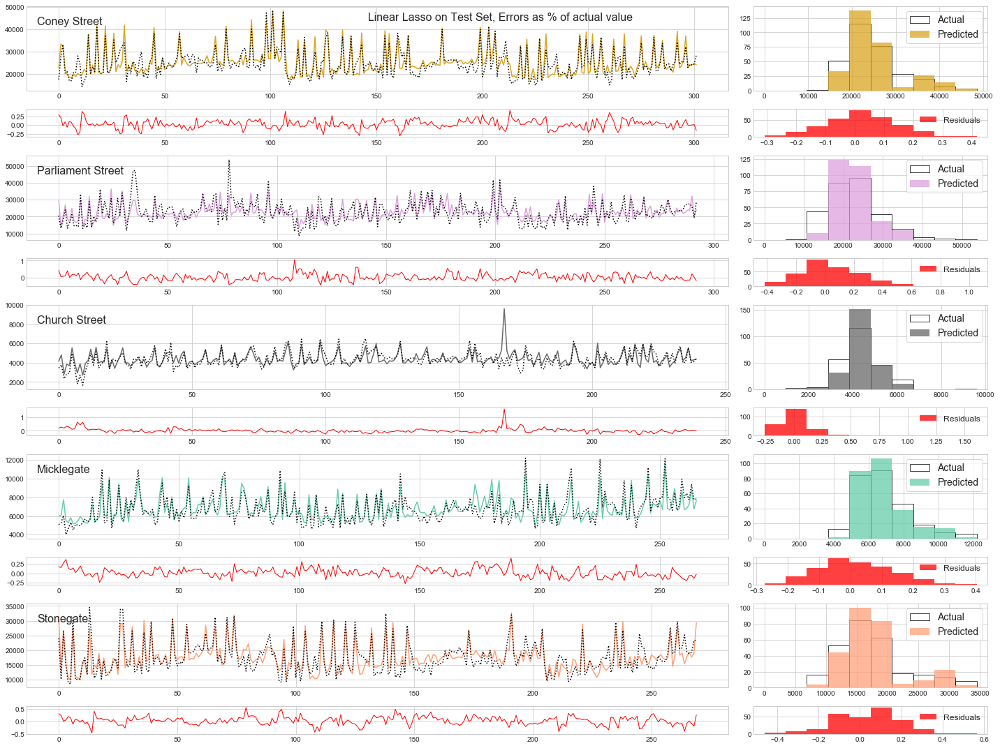

In [558]:
err_test = plot_comp_res_with_errors_d(la, X_test, Y_test, lrpredict(la,X_test), "Linear Lasso on Test Set, Errors as % of actual value")
save_fig('lasso_results', tight_layout=True, fig_extension="png", resolution=300)

In [687]:
for i,s in enumerate(streets):
    display(pd.DataFrame(lreg_coef[i]))
    print(np.min(lreg_coef[i]), np.max(lreg_coef[i]))

,0,1,2,3,4
0,"7,563.08","5,748.71","4,370.54","4,193.49","10,155.04"
1,"22,248.47","5,898.83","4,150.57","7,120.50","5,950.17"
2,"17,449.64","6,885.26",840.45,"10,031.41","5,618.25"
3,"17,302.38","7,035.51","3,233.26","12,135.19","2,310.42"
4,"20,572.20","6,477.73",17.02,"13,110.78","4,456.13"
5,"54,612.85","3,375.18","4,174.09","10,860.43",439.04
6,"8,554.94","9,061.49","1,074.08","6,365.23","2,750.36"


17.0168382948 54612.8470559


,0,1,2,3,4
0,"9,496.89","5,614.67","3,944.99","12,848.41","38,361.66"
1,"14,519.31","1,222.23","6,497.65","9,536.22","40,053.26"
2,"15,284.73","4,117.03","5,255.69","8,827.02","18,707.08"
3,232.57,"2,966.38","13,184.78","12,524.79","34,873.85"
4,996.15,"5,136.19","9,900.05","10,954.67","151,424.95"
5,"27,399.51","7,230.70","1,410.79","2,953.98","53,302.61"
6,"5,959.48","8,371.64","2,702.40","5,284.76","12,507.52"


232.566572465 151424.954764


,0,1,2,3,4
0,"27,624.32",271.01,253.13,88.96,"3,531.72"
1,"15,300.17",268.60,435.42,"1,159.25","8,091.17"
2,"27,013.62",461.79,41.20,"2,175.40","6,091.19"
3,"27,007.11",280.15,201.74,9.41,"3,370.90"
4,"28,296.96",543.66,251.92,882.76,"7,517.80"
5,"34,835.01",212.23,"1,401.93",584.53,"8,520.28"
6,"41,873.32",533.78,242.09,283.44,"9,725.14"


9.40896727159 41873.3195742


,0,1,2,3,4
0,"38,027.75",225.71,"1,844.05","1,977.03","2,847.73"
1,"26,957.79",382.15,"1,816.89","3,058.18","3,045.99"
2,"18,096.94",160.67,"2,539.25",253.51,"10,071.63"
3,"26,387.57",43.82,"2,672.81","2,646.95","2,759.91"
4,"17,776.30",660.18,"2,463.65","1,910.74","15,964.03"
5,"28,501.70",925.39,"1,330.10","2,716.10","15,445.58"
6,"2,997.98",945.17,"2,163.04",831.87,"10,814.53"


43.8157411167 38027.7521737


,0,1,2,3,4
0,"12,222.32","4,588.51","6,617.71","4,927.94","2,397.24"
1,"25,647.97","3,991.00","6,743.59","6,886.39","10,413.33"
2,"17,417.35","4,689.46","6,798.13","7,703.44","9,867.42"
3,"21,095.29","4,753.02","6,142.84","11,205.81","2,078.77"
4,"19,427.04","3,807.37","1,823.95","4,749.15","10,467.87"
5,"40,817.29","5,180.82","6,397.24","6,934.90",955.85
6,"6,443.56","6,531.29",247.36,"1,116.26",560.34


247.355413706 40817.2920939


Saving figure lr_weights


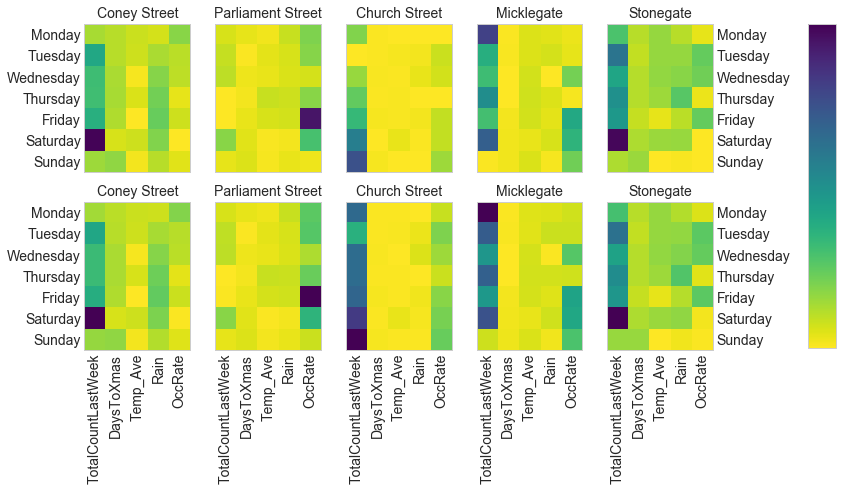

In [705]:
curColList = get_columns(dataCleanPipe)
lasso_coef = [[[abs(la[i,j].coef_[k]) for k,c in enumerate(curColList[1:])] 
                for j,d in enumerate(weekdays)] for i, s in enumerate(streets)]
lreg_coef = [[[abs(ll[i,j].coef_[k]) for k,c in enumerate(curColList[1:])] 
                for j,d in enumerate(weekdays)] for i, s in enumerate(streets)]

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(13,6))
#fig.suptitle('Relative coefficient weights - Lasso Regularisation (top) - No regularisation (bottom)', fontsize=16)

for i,s in enumerate(streets):
    im = axes[0,i].imshow(lasso_coef[i], cmap='viridis_r',origin='upper', interpolation='nearest', 
                          vmin=np.min(lreg_coef[i]), vmax=np.max(lreg_coef[i]))
    axes[0,i].yaxis.set_ticks([])
    axes[0,i].xaxis.set_ticks([])
    axes[0,i].set_title(s, fontsize=14)
    axes[0,i].grid(False)
   # cbar = fig.colorbar(im)#, ticks=[0, 1])
    
axes[0,0].set_yticks([0,1,2,3,4,5,6])
axes[0,0].set_yticklabels(weekdays, fontsize=14)
axes[0,4].yaxis.tick_right()
axes[0,4].yaxis.set_label_position("right")
axes[0,4].set_yticks([0,1,2,3,4,5,6])
axes[0,4].set_yticklabels(weekdays, fontsize=14)

#fig.suptitle('Relative coefficient weights - No Regularisation', fontsize=16)
for i,s in enumerate(streets):
    axes[1,i].imshow(lreg_coef[i], cmap='viridis_r',origin='upper', interpolation='nearest', 
                     vmin=np.min(lreg_coef[i]), vmax=np.max(lreg_coef[i]))
    axes[1,i].yaxis.set_ticks([])
    axes[1,i].set_xticks([0,1,2,3,4])
    axes[1,i].set_xticklabels(curColList[1:], fontsize=14, rotation='vertical')
    axes[1,i].set_title(s, fontsize=14)
    axes[1,i].grid(False)
    
axes[1,0].set_yticks([0,1,2,3,4,5,6])
axes[1,0].set_yticklabels(weekdays, fontsize=14)
axes[1,4].yaxis.tick_right()
axes[1,4].yaxis.set_label_position("right")
axes[1,4].set_yticks([0,1,2,3,4,5,6])
axes[1,4].set_yticklabels(weekdays, fontsize=14)    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.90, 0.13, 0.03, 0.75])
fig.colorbar(im, cax=cbar_ax, ticks=[0,1])

save_fig('lr_weights', tight_layout=False, fig_extension="png", resolution=300)


In [528]:
# Can do better, we can also look at more complex linear models
def create_daily_sets_per_street_p(pipe, datadf):
    X, Y = {}, {}
    for i, s in enumerate(streets):
        for j, d in enumerate(weekdays):
            dataCleanPipe.set_params(street_sel__street=s, weekday_sel__weekday=d)
            X[i,j] = dataCleanPipe.fit_transform(datadf)  #Create one training set per street, per day
            Y[i,j] = X[i,j][:,0]                 #Separate target values (they are in the 1st column)
            X[i,j] = np.delete(X[i,j], 0, 1)     #Remove the first column
            X[i,j] = pipe.fit_transform(X[i,j])  #Apply Polynomial trasnformation AFTER removing target           
    return X,Y

In [529]:
#Let's look at Linear regression models with a polynomial basis function to capture non-linearities in the data
from sklearn.preprocessing import PolynomialFeatures

polydeg = 2

dataPolyPipe = Pipeline([
        ("poly_feat", PolynomialFeatures(degree=polydeg,include_bias=False)),
        ])

X_train_d, Y_train_d = create_daily_sets_per_street_p(dataPolyPipe, Traindf)
X_test_d, Y_test_d = create_daily_sets_per_street_p(dataPolyPipe, Testdf)


#poly_feat = PolynomialFeatures(degree=polydeg,include_bias=False)



In [530]:
ll = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        ll[i,j] = LinearRegression()
        ll[i,j].fit(X_train_d[i,j], Y_train_d[i,j])
          
lr = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        lr[i,j] = Ridge()
        lr[i,j].fit(X_train_d[i,j], Y_train_d[i,j])
        
la = {}
for i, s in enumerate(streets):
    for j, d in enumerate(weekdays): 
        la[i,j] = Lasso()
        la[i,j].fit(X_train_d[i,j], Y_train_d[i,j])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [531]:
display_LR_stats(ll, X_train_d, Y_train_d)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

'RMSE'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"2,689.97","2,855.58","2,601.82","2,756.66","2,605.02","2,294.17","2,886.01"
Parliament Street,"3,047.12","3,321.97","3,485.02","3,211.57","3,727.65","4,946.81","3,456.79"
Church Street,314.94,341.43,347.94,430.95,353.05,426.75,470.65
Micklegate,723.16,574.08,655.85,658.69,631.83,892.86,659.07
Stonegate,"2,619.22","2,025.63","2,002.03","2,133.58","2,368.15","2,105.79","2,178.27"


'R2'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.51,0.50,0.57,0.56,0.58,0.69,0.51
Parliament Street,0.43,0.31,0.37,0.44,0.40,0.50,0.47
Church Street,0.50,0.39,0.53,0.45,0.68,0.55,0.58
Micklegate,0.52,0.53,0.52,0.52,0.58,0.52,0.46
Stonegate,0.52,0.68,0.67,0.64,0.50,0.65,0.47


In [532]:
display_LR_stats(lr, X_train_d, Y_train_d)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

'RMSE'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"3,006.27","3,107.87","2,948.91","3,191.29","3,268.24","2,964.06","3,051.35"
Parliament Street,"3,413.43","3,594.47","3,803.07","3,656.87","4,501.68","6,079.72","3,927.79"
Church Street,429.84,417.61,479.45,549.74,571.85,598.26,678.88
Micklegate,865.41,690.40,831.31,787.46,796.83,"1,177.66",792.07
Stonegate,"2,994.11","2,505.27","2,438.44","2,495.61","2,836.74","2,597.12","2,522.14"


'R2'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.38,0.41,0.45,0.41,0.35,0.49,0.45
Parliament Street,0.28,0.19,0.25,0.28,0.13,0.25,0.32
Church Street,0.07,0.09,0.11,0.10,0.16,0.13,0.13
Micklegate,0.31,0.33,0.24,0.32,0.33,0.17,0.22
Stonegate,0.38,0.51,0.52,0.51,0.28,0.47,0.29


In [533]:
display_LR_stats(la, X_train_d, Y_train_d)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

'RMSE'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"2,896.56","2,928.27","2,656.12","2,967.14","2,841.54","2,389.30","2,977.65"
Parliament Street,"3,180.78","3,421.55","3,579.11","3,395.02","3,946.86","5,249.92","3,633.44"
Church Street,404.61,400.94,449.09,516.33,520.76,490.99,548.92
Micklegate,761.21,623.00,743.24,717.14,694.14,996.84,760.77
Stonegate,"2,752.49","2,214.59","2,132.37","2,258.39","2,723.41","2,234.22","2,471.52"


'R2'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.43,0.48,0.55,0.49,0.51,0.67,0.47
Parliament Street,0.38,0.27,0.34,0.38,0.33,0.44,0.42
Church Street,0.18,0.16,0.22,0.20,0.30,0.41,0.43
Micklegate,0.47,0.45,0.39,0.44,0.49,0.41,0.28
Stonegate,0.47,0.61,0.63,0.60,0.34,0.60,0.32


In [542]:
#let's look at ll over the test set
display_LR_stats(la, X_test_d, Y_test_d)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

'RMSE'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,"3,555.52","2,568.71","3,251.46","2,983.50","2,912.53","3,140.98","3,021.67"
Parliament Street,"3,370.54","3,685.49","4,096.10","4,625.41","4,585.58","7,231.73","4,452.51"
Church Street,484.87,422.22,595.12,489.77,575.58,503.02,"1,043.14"
Micklegate,697.14,601.15,629.43,681.25,"1,060.21",979.60,859.52
Stonegate,"3,493.78","2,954.80","2,747.92","2,891.73","2,439.29","3,297.50","2,387.13"


'R2'

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Coney Street,0.08,0.37,0.29,0.30,0.33,0.47,0.39
Parliament Street,0.22,0.30,0.27,0.23,-0.05,0.02,0.30
Church Street,0.09,0.26,-0.34,0.04,0.11,0.33,-1.73
Micklegate,0.41,0.35,0.50,0.41,0.08,0.52,0.38
Stonegate,0.17,0.00,0.38,0.08,0.47,-0.17,0.23


In [551]:
def lrpredictp(mdl, X):
    Y_pred = {}
    Y_prednew = {}
    wkdaycols = [5+sorted(weekdays).index(wkd) for wkd in weekdays]
    for i, s in enumerate(streets):
        #Y_pred[i] = np.zeros(len(X[i]))
        for j, d in enumerate(weekdays):
            indices =[r for r, row in enumerate(X[i]) if row[wkdaycols[j]]==1]  
            Xij = [row for r, row in enumerate(X[i]) if r in indices]
            Xij = [row for r, row in enumerate(X[i]) if r in indices]
            Xij = [row for i, row in enumerate([list(x) for x in zip(*Xij)]) if i <=4] #transpose and delete rows
            Xij = [list(x) for x in zip(*Xij)] #transpose back == columns deleted
            Xij  = dataPolyPipe.fit_transform(Xij)
            Yij = mdl[i,j].predict(Xij)
            for k,p in enumerate(indices): Y_pred[i,p] = Yij[k]
    Y_new = dict(zip(sorted(Y_pred), [value for (key, value) in sorted(Y_pred.items())])) 
    for i, s in enumerate(streets):
        Y_prednew[i] = [value for (key, value) in list(Y_new.items()) if key[0]==i]
    return Y_prednew

Y = lrpredictp(la,X_test)

ValueError: shapes (44,20) and (5,) not aligned: 20 (dim 1) != 5 (dim 0)

In [537]:
max(Y[2])

17799.215637113201

In [538]:
 

def plot_comp_res_with_errors_d(mdl,X ,Y, Y_pred, description ):
    err={}
    fig, axes = plt.subplots(nrows=2*len(streets), ncols=2, figsize=(20,15), 
                             gridspec_kw = {'width_ratios':[3,1], 'height_ratios':[3,1,3,1,3,1,3,1,3,1]})
    plt.suptitle(description, fontsize=16)
    for i, s in enumerate(streets):
        err[i] = np.divide((Y_pred[i] - Y[i]), Y[i])
        #err[i] = (Y_pred[i] - Y[i])
        axes[2*i][0].plot(Y_pred[i],c=stColors.get(s), label=s)
        axes[2*i][0].plot(Y[i], c='k', ls=':')
        axes[2*i+1][0].plot(err[i], 'r-', linewidth=1)
        leg = axes[2*i][0].legend(frameon=False, loc="upper left", fontsize=16,
                                  handlelength=0, handletextpad=0, fancybox=True)
        for item in leg.legendHandles:
            item.set_visible(False)
        #ax.set_ylabel('y2', color='r')
        bins = np.linspace(0, max(max(Y[i]), max(Y_pred[i])),11)
        axes[2*i][1].hist(Y[i], bins=bins, facecolor= 'None',edgecolor='k', alpha=0.75, label='Actual')
        axes[2*i][1].hist(Y_pred[i], bins=bins, facecolor=stColors.get(s), alpha=0.75, label='Predicted')
        axes[2*i][1].legend(frameon=True, loc="upper right", fontsize=14)
        axes[2*i+1][1].hist(err[i], facecolor='r', alpha=0.75, label = 'Residuals')
        axes[2*i+1][1].legend(frameon=False, loc="upper right", fontsize=12)
    return err

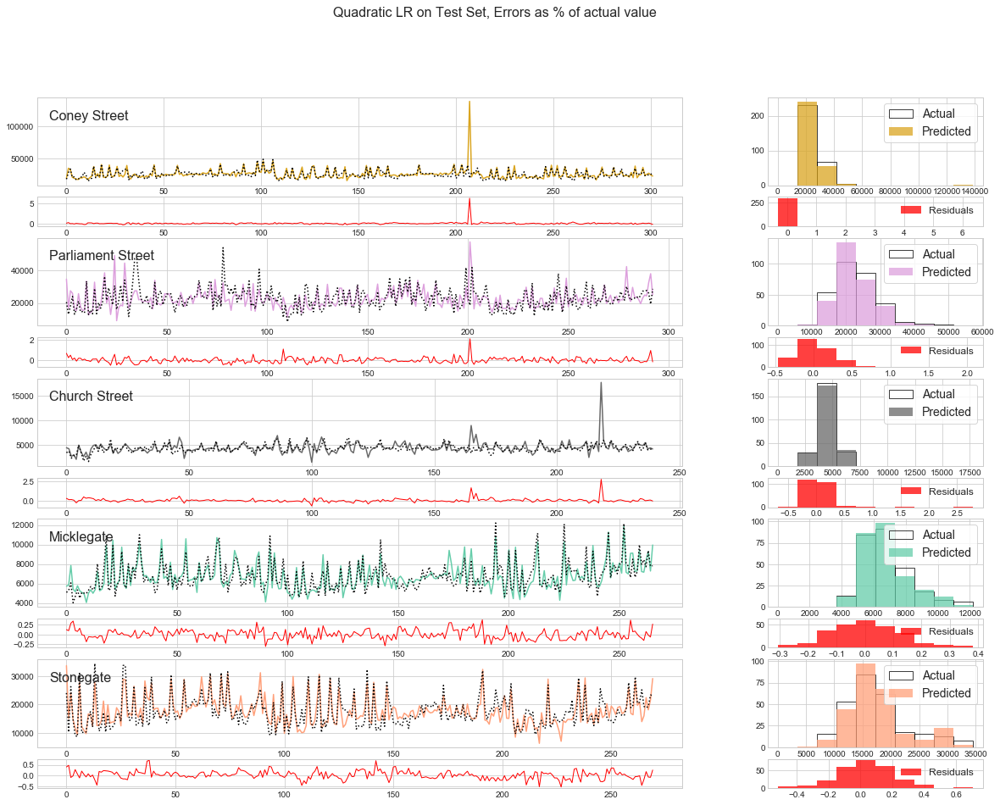

In [544]:
err_test = plot_comp_res_with_errors_d(la, X_test, Y_test, lrpredictp(ll,X_test), "Quadratic LR on Test Set, Errors as % of actual value")
